<a href="https://colab.research.google.com/github/JJaceyV/DiamondEDA-Prediction/blob/main/Diamond_Analysis_and_Prediction.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#**Kết nối ggdrive và tải thư viện cần thiết**

In [ ]:
## kết nối ggdrive
from google.colab import drive
drive.mount('/content/gdrive',force_remount=True)
folder = ('/content/gdrive/My Drive/dataviz_project')

Mounted at /content/gdrive


In [ ]:
## tải thư viện
!pip install plotly
!pip install pyalluvial
!pip install tabulate

In [ ]:
## import thư viện
import numpy                as np
import pandas               as pd
import seaborn              as sns
import scipy.stats          as stats
import plotly.express       as px
import matplotlib.pyplot    as plt
import pyalluvial.alluvial  as alluvia
import plotly.express       as px
from collections            import Counter
from statsmodels.imputation import mice
from sklearn.preprocessing  import MinMaxScaler
from tabulate import tabulate
import plotly.express as px
import plotnine as pn
from scipy.stats import chi2_contingency
import statsmodels.api as sm
from statsmodels.formula.api import ols
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import PolynomialFeatures
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score


#**Cách tạo missing values cho dữ liệu**

In [ ]:
#df = pd.read_csv('diamonds.csv')
#df.info()
#index_column_to_null = [1,7,8,9,10]
#for i in range(s):
  #col = random.choice(index_column_to_null)
  #row = random.randint(0, df.shape[0] - 1)
  #df.iloc[row,col] = None

In [ ]:
#df.info()

In [ ]:
#df.to_csv('modified_diamonds.csv', index=False)

In [ ]:
#files.download('modified_diamonds.csv')

#**Quan sát dữ liệu**

In [ ]:
## Mô tả thuộc tính
# Đọc file
data = pd.read_csv('/content/gdrive/My Drive/dataviz_project/modified_diamonds.csv')

# Kích thước dữ liệu & thông tin về các cột của dữ liệu
print('Kích thước của dữ liệu:',data.shape)
print('\nThông tin về các cột dữ liệu:\n')
print(data.info())

Kích thước của dữ liệu: (53940, 11)

Thông tin về các cột dữ liệu:

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 53940 entries, 0 to 53939
Data columns (total 11 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   Unnamed: 0  53940 non-null  int64  
 1   carat       53190 non-null  float64
 2   cut         53940 non-null  object 
 3   color       53940 non-null  object 
 4   clarity     53940 non-null  object 
 5   depth       53940 non-null  float64
 6   table       53940 non-null  float64
 7   price       53201 non-null  float64
 8   x           53162 non-null  float64
 9   y           53201 non-null  float64
 10  z           53194 non-null  float64
dtypes: float64(7), int64(1), object(3)
memory usage: 4.5+ MB
None


In [ ]:
# Nhìn sơ qua tập dữ liệu
print('\nNội dung tập dữ liệu:\n')
data.head(15)


Nội dung tập dữ liệu:



,Unnamed: 0,carat,cut,color,clarity,depth,table,price,x,y,z
0,1,0.23,Ideal,E,SI2,61.5,55.0,326.0,3.95,3.98,2.43
1,2,0.21,Premium,E,SI1,59.8,61.0,326.0,3.89,3.84,2.31
2,3,0.23,Good,E,VS1,56.9,65.0,327.0,4.05,4.07,2.31
3,4,0.29,Premium,I,VS2,62.4,58.0,334.0,4.20,4.23,2.63
4,5,0.31,Good,J,SI2,63.3,58.0,335.0,4.34,4.35,2.75
5,6,0.24,Very Good,J,VVS2,62.8,57.0,336.0,3.94,3.96,2.48
6,7,NaN,Very Good,I,VVS1,62.3,57.0,336.0,3.95,3.98,NaN
7,8,0.26,Very Good,H,SI1,61.9,55.0,337.0,4.07,4.11,2.53
8,9,0.22,Fair,E,VS2,65.1,61.0,337.0,3.87,3.78,2.49
9,10,0.23,Very Good,H,VS1,59.4,61.0,338.0,4.00,4.05,2.39


In [ ]:
# Xác định biến phân loại, biến số
categorical = []
numeric = []
for i in range(0,data.shape[1]):
  if data.iloc[:,i].dtypes == 'int64' or data.iloc[:,i].dtypes == 'float64':
    numeric.append(data.columns[i])
  else:
    categorical.append(data.columns[i])
print('\nCác biến phân loại của dataset bao gồm:')
for i in range(0,len(categorical)):
  if i == len(categorical) - 1:
    print(categorical[i],end='.')
  else:
    print(categorical[i],end=', ')
print('\n\nCác biến số của dataset bao gồm:')
for i in range(0,len(numeric)):
  if i == len(numeric) - 1:
    print(numeric[i],end='.')
  else:
    print(numeric[i],end=', ')

# Các cột có chứa dữ liệu null
null_dict = {}
for i in range(0,data.shape[1]):
  if  data.iloc[:,i].isnull().sum() > 0:
    null_dict[data.columns[i]] = data.iloc[:,i].isnull().sum()
print('\n\nCác cột có chứa dữ liệu null bao gồm:')
for key,value in null_dict.items():
  for i, (k,v) in enumerate(null_dict.items()):
    if i ==(len(null_dict) -1):
      print(k,end='.')
    else:
      print(k,end=', ')
  break


Các biến phân loại của dataset bao gồm:
cut, color, clarity.

Các biến số của dataset bao gồm:
Unnamed: 0, carat, depth, table, price, x, y, z.

Các cột có chứa dữ liệu null bao gồm:
carat, price, x, y, z.

#**Miêu tả từng thuộc tính**

##*Carat*

In [ ]:
# Các thông số xác suất đánh giá thuộc tính
print('Các thông số xác suất của biến \'Carat\':\n')
print(data.carat.describe())
print('\nSố giá trị null của biến \'Carat\':',null_dict["carat"])
print('Tỉ lệ missing values trên tổng số dữ liệu của biến \'Carat\':',round((null_dict["carat"]/data.shape[0]),2))

Các thông số xác suất của biến 'Carat':

count    53190.000000
mean         0.798080
std          0.474205
min          0.200000
25%          0.400000
50%          0.700000
75%          1.040000
max          5.010000
Name: carat, dtype: float64

Số giá trị null của biến 'Carat': 750
Tỉ lệ missing values trên tổng số dữ liệu của biến 'Carat': 0.01


Text(0.5, 1.0, 'Boxplot thể hiện phân phối dữ liệu của biến Carat')

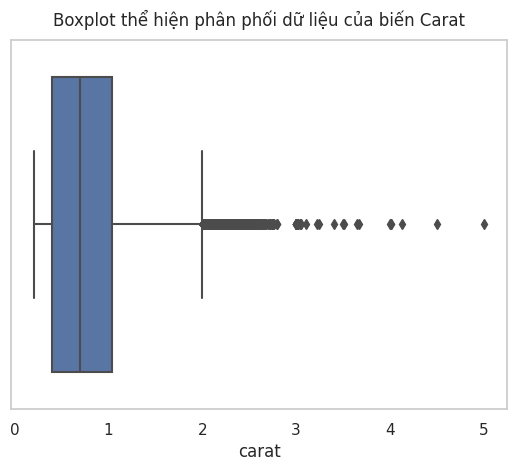

In [ ]:
## Vẽ boxplot quan sát outliers
sns.boxplot(x=data.carat,orient='h')
plt.grid(False)
plt.title('Boxplot thể hiện phân phối dữ liệu của biến Carat',pad=10)

##*Price*

In [ ]:
# Các thông số xác suất đánh giá thuộc tính
print('Các thông số xác suất của biến \'Price\':\n')
print(data.price.describe())
print('\nSố giá trị null của biến \'Price\':',null_dict["price"])
print('Tỉ lệ missing values trên tổng số dữ liệu của biến \'Price\':',round((null_dict["price"]/data.shape[0]),2))

Các thông số xác suất của biến 'Price':

count    53201.000000
mean      3934.016898
std       3989.620914
min        326.000000
25%        951.000000
50%       2403.000000
75%       5325.000000
max      18823.000000
Name: price, dtype: float64

Số giá trị null của biến 'Price': 739
Tỉ lệ missing values trên tổng số dữ liệu của biến 'Price': 0.01


Text(0.5, 1.0, 'Boxplot thể hiện phân phối dữ liệu của biến Price')

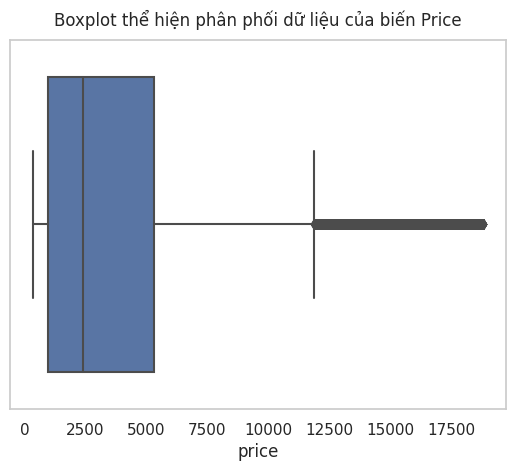

In [ ]:
## Vẽ boxplot quan sát outliers
sns.boxplot(x=data.price,orient='h')
plt.grid(False)
plt.title('Boxplot thể hiện phân phối dữ liệu của biến Price',pad=10)

##*x*

In [ ]:
# Các thông số xác suất đánh giá thuộc tính
print('Các thông số xác suất của biến \'x\':\n')
print(data.x.describe())
print('\nSố giá trị null của biến \'x\':',null_dict["x"])
print('Tỉ lệ missing values trên tổng số dữ liệu của biến \'x\':',round((null_dict["x"]/data.shape[0]),2))

Các thông số xác suất của biến 'x':

count    53162.000000
mean         5.731735
std          1.121650
min          0.000000
25%          4.710000
50%          5.700000
75%          6.540000
max         10.740000
Name: x, dtype: float64

Số giá trị null của biến 'x': 778
Tỉ lệ missing values trên tổng số dữ liệu của biến 'x': 0.01


Text(0.5, 1.0, 'Boxplot thể hiện phân phối dữ liệu của biến x')

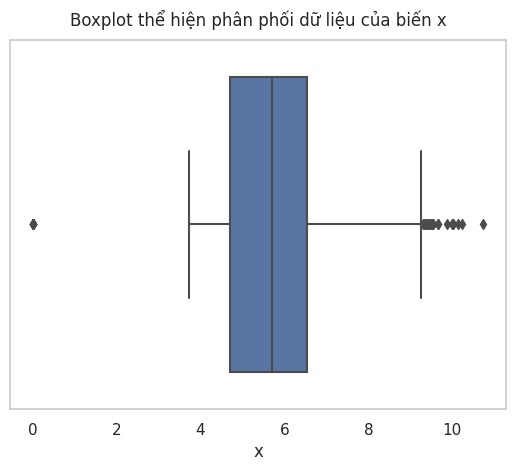

In [ ]:
## Vẽ boxplot quan sát outliers
sns.boxplot(x=data['x'],orient='h')
plt.grid(False)
plt.title('Boxplot thể hiện phân phối dữ liệu của biến x',pad=10)

##*y*

In [ ]:
# Các thông số xác suất đánh giá thuộc tính
print('Các thông số xác suất của biến \'y\':\n')
print(data.y.describe())
print('\nSố giá trị null của biến \'y\':',null_dict["y"])
print('Tỉ lệ missing values trên tổng số dữ liệu của biến \'y\':',round((null_dict["y"]/data.shape[0]),2))

Các thông số xác suất của biến 'y':

count    53201.000000
mean         5.734540
std          1.142377
min          0.000000
25%          4.720000
50%          5.710000
75%          6.540000
max         58.900000
Name: y, dtype: float64

Số giá trị null của biến 'y': 739
Tỉ lệ missing values trên tổng số dữ liệu của biến 'y': 0.01


Text(0.5, 1.0, 'Boxplot thể hiện phân phối dữ liệu của biến y')

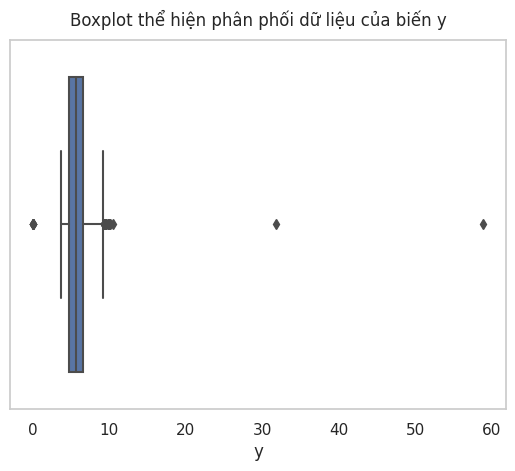

In [ ]:
## Vẽ boxplot quan sát outliers
sns.boxplot(x=data.y,orient='h')
plt.grid(False)
plt.title('Boxplot thể hiện phân phối dữ liệu của biến y',pad=10)

##*z*

In [ ]:
# Các thông số xác suất đánh giá thuộc tính
print('Các thông số xác suất của biến \'z\':\n')
print(data.z.describe())
print('\nSố giá trị null của biến \'z\':',null_dict["z"])
print('Tỉ lệ missing values trên tổng số dữ liệu của biến \'z\':',round((null_dict["z"]/data.shape[0]),2))

Các thông số xác suất của biến 'z':

count    53194.000000
mean         3.539382
std          0.705784
min          0.000000
25%          2.910000
50%          3.530000
75%          4.040000
max         31.800000
Name: z, dtype: float64

Số giá trị null của biến 'z': 746
Tỉ lệ missing values trên tổng số dữ liệu của biến 'z': 0.01


Text(0.5, 1.0, 'Boxplot thể hiện phân phối dữ liệu của biến z')

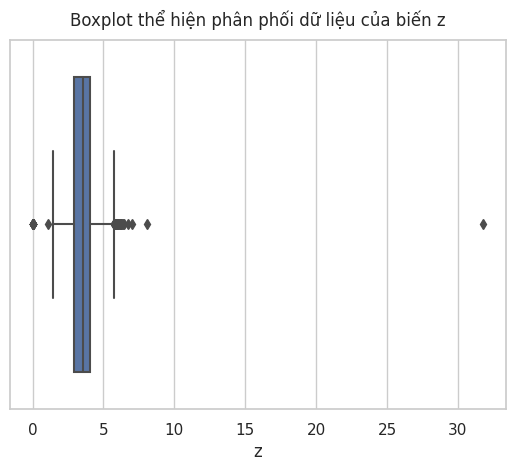

In [ ]:
## Vẽ boxplot quan sát outliers
sns.boxplot(x=data.z,orient='h')
plt.title('Boxplot thể hiện phân phối dữ liệu của biến z',pad=10)

##*Table*

In [ ]:
# Các thông số xác suất đánh giá thuộc tính
print('Các thông số xác suất của biến \'Table\':\n')
print(data.table.describe())
if 'table' not in null_dict.keys():
  print('Số giá trị null của biến \'Table\': 0')
else:
  print('Số giá trị null của biến \'Table\':',null_dict['table'])

Các thông số xác suất của biến 'Table':

count    53940.000000
mean        57.457184
std          2.234491
min         43.000000
25%         56.000000
50%         57.000000
75%         59.000000
max         95.000000
Name: table, dtype: float64
Số giá trị null của biến 'Table': 0


Text(0.5, 1.0, 'Boxplot thể hiện phân phối dữ liệu của biến Table')

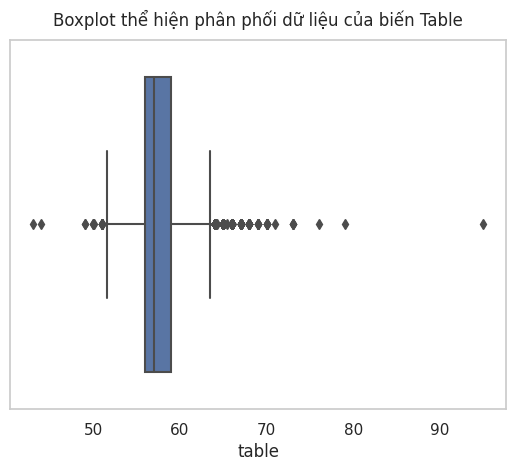

In [ ]:
## Vẽ boxplot quan sát outliers
sns.boxplot(x=data.table,orient='h')
plt.grid(False)
plt.title('Boxplot thể hiện phân phối dữ liệu của biến Table',pad=10)

##*Depth*

In [ ]:
# Các thông số xác suất đánh giá thuộc tính
print('Các thông số xác suất của biến \'Depth\':\n')
print(data.depth.describe())
if 'depth' not in null_dict.keys():
  print('Số giá trị null của biến \'Depth\': 0')
else:
  print('Số giá trị null của biến \'Depth\':',null_dict['depth'])


Các thông số xác suất của biến 'Depth':

count    53940.000000
mean        61.749405
std          1.432621
min         43.000000
25%         61.000000
50%         61.800000
75%         62.500000
max         79.000000
Name: depth, dtype: float64
Số giá trị null của biến 'Depth': 0


Text(0.5, 1.0, 'Boxplot thể hiện phân phối dữ liệu của biến Depth')

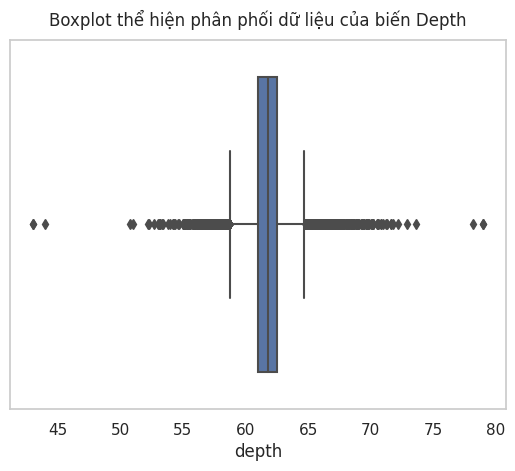

In [ ]:
## Vẽ boxplot quan sát outliers
sns.boxplot(x=data.depth,orient='h')
plt.grid(False)
plt.title('Boxplot thể hiện phân phối dữ liệu của biến Depth',pad=10)

##*Table*

In [ ]:
# Các thông số xác suất đánh giá thuộc tính
print('Các thông số xác suất của biến \'Table\':\n')
print(data.table.describe())
if 'table' not in null_dict.keys():
  print('Số giá trị null của biến \'Table\': 0')
else:
  print('Số giá trị null của biến \'Table\':',null_dict['table'])


Các thông số xác suất của biến 'Table':

count    53940.000000
mean        57.457184
std          2.234491
min         43.000000
25%         56.000000
50%         57.000000
75%         59.000000
max         95.000000
Name: table, dtype: float64
Số giá trị null của biến 'Table': 0


Text(0.5, 1.0, 'Boxplot thể hiện phân phối dữ liệu của biến Table')

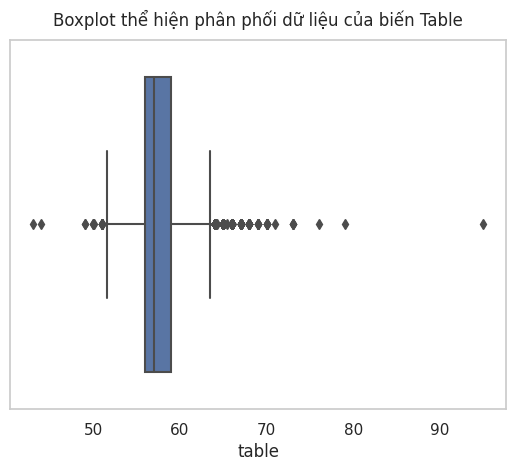

In [ ]:
## Vẽ boxplot quan sát outliers
sns.boxplot(x=data.table,orient='h')
plt.grid(False)
plt.title('Boxplot thể hiện phân phối dữ liệu của biến Table',pad=10)

##*Clarity*

In [ ]:
# Các thông số quan sát thuộc tính
print('Các thông số xác suất của biến \'Clarity\':')
print(data.clarity.describe())
print('Các giá trị unique của biến \'Clarity\' cụ thể là:',data.clarity.unique())


Các thông số xác suất của biến 'Clarity':
count     53940
unique        8
top         SI1
freq      13065
Name: clarity, dtype: object
Các giá trị unique của biến 'Clarity' cụ thể là: ['SI2' 'SI1' 'VS1' 'VS2' 'VVS2' 'VVS1' 'I1' 'IF']


##*Cut*

In [ ]:
# Các thông số quan sát thuộc tính
print('Các thông số xác suất của biến \'Cut\':')
print(data.cut.describe())
print('Các giá trị unique của biến \'Cut\' cụ thể là:',data.cut.unique())


Các thông số xác suất của biến 'Cut':
count     53940
unique        5
top       Ideal
freq      21551
Name: cut, dtype: object
Các giá trị unique của biến 'Cut' cụ thể là: ['Ideal' 'Premium' 'Good' 'Very Good' 'Fair']


##*Color*

In [ ]:
# Các thông số quan sát thuộc tính
print('Các thông số xác suất của biến \'Color\':')
print(data.color.describe())
print('Các giá trị unique của biến \'Color\' cụ thể là:',data.color.unique())


Các thông số xác suất của biến 'Color':
count     53940
unique        7
top           G
freq      11292
Name: color, dtype: object
Các giá trị unique của biến 'Color' cụ thể là: ['E' 'I' 'J' 'H' 'F' 'G' 'D']


#**Tiền xử lý dữ liệu**

##*Xóa cột Unnamed: 0*

In [ ]:
data = data.drop(["Unnamed: 0"], axis=1)
data.describe()

,carat,depth,table,price,x,y,z
count,53190.000000,53940.000000,53940.000000,53201.000000,53162.000000,53201.000000,53194.000000
mean,0.798080,61.749405,57.457184,3934.016898,5.731735,5.734540,3.539382
std,0.474205,1.432621,2.234491,3989.620914,1.121650,1.142377,0.705784
min,0.200000,43.000000,43.000000,326.000000,0.000000,0.000000,0.000000
25%,0.400000,61.000000,56.000000,951.000000,4.710000,4.720000,2.910000
50%,0.700000,61.800000,57.000000,2403.000000,5.700000,5.710000,3.530000
75%,1.040000,62.500000,59.000000,5325.000000,6.540000,6.540000,4.040000
max,5.010000,79.000000,95.000000,18823.000000,10.740000,58.900000,31.800000


##*Kiểm tra và xử lý trùng lặp*

In [ ]:
data.duplicated().sum()

127

In [ ]:
dup_rows = data[data.duplicated()]
dup_rows

,carat,cut,color,clarity,depth,table,price,x,y,z
1005,0.79,Ideal,G,SI1,62.3,57.0,2898.0,5.90,5.85,3.66
1006,0.79,Ideal,G,SI1,62.3,57.0,2898.0,5.90,5.85,3.66
1008,0.79,Ideal,G,SI1,62.3,57.0,2898.0,5.90,5.85,3.66
2025,1.52,Good,E,I1,57.3,58.0,3105.0,7.53,7.42,4.28
2183,1.00,Fair,E,SI2,67.0,53.0,3136.0,6.19,6.13,4.13
...,...,...,...,...,...,...,...,...,...,...
47069,0.52,Ideal,D,VS2,61.8,55.0,1822.0,5.16,5.19,3.20
47296,0.30,Good,J,VS1,63.4,57.0,394.0,4.23,4.26,2.69
49557,0.71,Good,F,SI2,64.1,60.0,2130.0,0.00,0.00,0.00
50079,0.51,Ideal,F,VVS2,61.2,56.0,2203.0,5.19,5.17,3.17


In [ ]:
data = data.drop_duplicates()

##*Kiểm tra và xử lý các giá trị x,y,z = 0*

In [ ]:
format_dict = {"carat" : "{:.2f}", "depth" : "{:.1f}", "table" : "{:.1f}", "x" : "{:.2f}", "y" : "{:.2f}", "z" : "{:.2f}"}
df_zero = data.loc[(data["x"] == 0) | (data["y"] == 0) | (data["z"] == 0)]
df_zero.style.apply(lambda x: ["background: yellow" if n == 0 else "" for n in x], axis = 1).format(format_dict)

,carat,cut,color,clarity,depth,table,price,x,y,z
2207,1.00,Premium,G,SI2,59.1,59.0,3142.000000,6.55,6.48,0.00
2314,1.01,Premium,H,I1,58.1,59.0,3167.000000,6.66,6.60,0.00
4791,1.10,Premium,G,SI2,63.0,59.0,3696.000000,6.50,6.47,0.00
5471,1.01,Premium,F,SI2,59.2,58.0,3837.000000,6.50,6.47,0.00
10167,1.50,Good,G,I1,64.0,61.0,4731.000000,7.15,nan,0.00
11182,1.07,Ideal,F,SI2,61.6,56.0,4954.000000,0.00,6.62,0.00
11963,1.00,Very Good,H,VS2,63.3,53.0,5139.000000,0.00,0.00,0.00
13601,1.15,Ideal,G,VS2,59.2,56.0,5564.000000,6.88,6.83,0.00
15951,1.14,Fair,G,VS1,57.5,67.0,6381.000000,0.00,0.00,0.00
24394,2.18,Premium,H,SI2,59.4,61.0,12631.000000,8.49,nan,0.00


In [ ]:
len(data[(data['x']==0) | (data['y']==0) | (data['z']==0)])

19

In [ ]:
data = data[(data[['x','y','z']] != 0).all(axis=1)]

In [ ]:
data.loc[(data['x']==0) | (data['y']==0) | (data['z']==0)]

,carat,cut,color,clarity,depth,table,price,x,y,z


##*Kiểm tra và xử lý missing values*

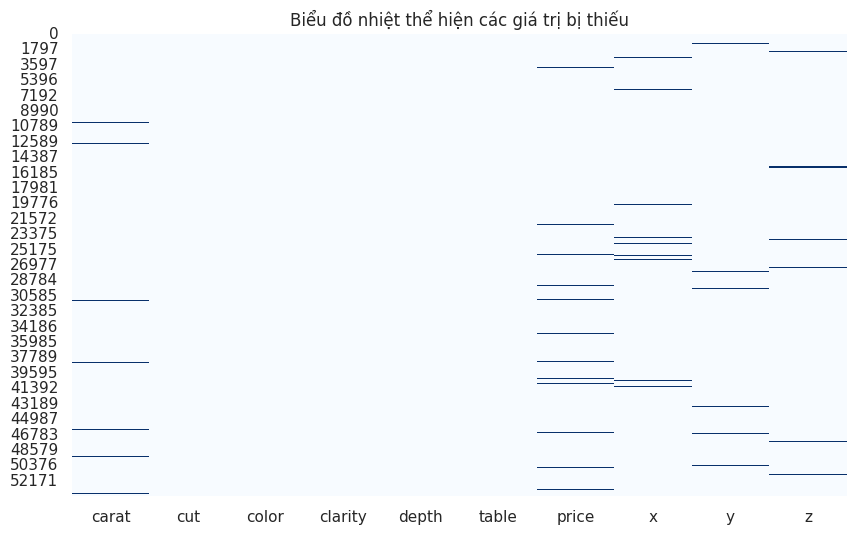

In [ ]:
# Trực quan hóa bằng heatmap thể hiện các ô có chứa missing values của biến
plt.figure(figsize=(10, 6))
sns.heatmap(data.isnull(), cbar=False, cmap='Blues')
plt.title('Biểu đồ nhiệt thể hiện các giá trị bị thiếu')
plt.show()

In [ ]:
# Tổng số missing values của từng biến
missing_values = data.isna().sum()
missing_values

carat      750
cut          0
color        0
clarity      0
depth        0
table        0
price      739
x          778
y          737
z          746
dtype: int64

In [ ]:
# Tỷ lệ missing values của từng biến
missing_values = data.isnull().sum()
missing_ratio = missing_values / len(data)
print(missing_ratio)

carat      0.013942
cut        0.000000
color      0.000000
clarity    0.000000
depth      0.000000
table      0.000000
price      0.013738
x          0.014463
y          0.013700
z          0.013868
dtype: float64


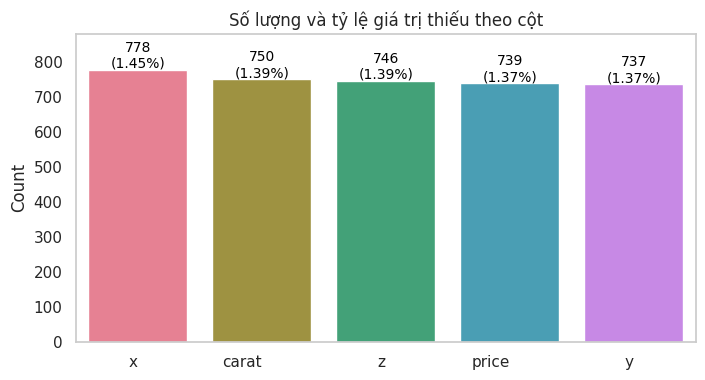

In [ ]:
# Tính số lượng và tỷ lệ giá trị thiếu
missing_values_count = data.isnull().sum()
missing_values_ratio = missing_values_count / len(data)

# Lọc ra các cột có giá trị thiếu
missing_values = pd.DataFrame({
    'Count': missing_values_count[missing_values_count > 0],
    'Ratio': missing_values_ratio[missing_values_count > 0]
})

# Sắp xếp giảm dần theo số lượng giá trị thiếu
missing_values.sort_values(by='Count', ascending=False, inplace=True)

# Chọn bảng màu mà bạn muốn sử dụng (ở đây mình sử dụng màu đậm hơn)
custom_palette = sns.color_palette("husl", n_colors=len(missing_values))

# Vẽ biểu đồ
plt.figure(figsize=(8, 4))
sns.set(style="whitegrid")
bar_plot = sns.barplot(x=missing_values.index, y='Count', data=missing_values, palette=custom_palette)
bar_plot.set_xticklabels(bar_plot.get_xticklabels(), rotation=45, horizontalalignment='right')

# Hiển thị số lượng và tỷ lệ trên đỉnh của cột
for p, value in zip(bar_plot.patches, missing_values['Count']):
    bar_plot.annotate(f'{value}\n({value / len(data) * 100:.2f}%)', (p.get_x() + p.get_width() / 2., p.get_height()),
                      ha='center', va='center', xytext=(0, 10), textcoords='offset points', fontsize=10, color='black')
plt.ylim(0, 880)
plt.title('Số lượng và tỷ lệ giá trị thiếu theo cột')
plt.xticks(rotation=0)
plt.grid(False)
plt.show()

In [ ]:
#Impute dữ liệu missing sử dụng phương pháp MICE
mice_df = pd.get_dummies(data,columns=['color','cut','clarity'])
for col in mice_df.columns:
    if not col.isidentifier():
        print(f"Column name '{col}' is not a valid identifier.")

# Nếu có tên cột không hợp lệ, bạn có thể điều chỉnh tên cột, ví dụ:
mice_df.columns = [col.replace(" ", "_") for col in mice_df.columns]

# Tiếp tục quá trình impute
processed_impute = mice.MICEData(mice_df)
processed_impute.update_all(10)
processed_df = processed_impute.data
# Kiểm tra giá trị null sau khi impute
for i in range(processed_df.shape[0]):
    if processed_df.iloc[i, :].isnull().any():
        print(f"Null values at index {i}:")
        print(processed_df.iloc[i, :])
    else:
        print("Không có giá trị null sau khi xử lý")
    break

Column name 'cut_Very Good' is not a valid identifier.
Không có giá trị null sau khi xử lý


In [ ]:
#Khôi phục lại dữ liệu trước khi áp dụng pd.dummies()
color_columns = ['color_E','color_I','color_J','color_H','color_F','color_G','color_D']
clarity_columns = ['clarity_SI2','clarity_SI1','clarity_VS1','clarity_VS2',
                   'clarity_VVS2','clarity_VVS1','clarity_I1','clarity_IF']
cut_columns = ['cut_Ideal','cut_Premium','cut_Good','cut_Very_Good','cut_Fair']
def update_df(columns_to_remove, df, new_column_to_add):
    index_dict = {col: [] for col in columns_to_remove}
    for col in columns_to_remove:
        for i in range(0, df.shape[0]):
            if df[col].iloc[i] == 1:
                index_dict[col].append(i)
    for k, v in index_dict.items():
        for i in v:
            if k == 'cut_Very_Good':
                df.loc[i, new_column_to_add] = 'Very Good'
            else:
                df.loc[i, new_column_to_add] = k.split('_')[1]
    df.drop(columns=columns_to_remove, inplace=True)

# Update the dataframe
update_df(color_columns, processed_df, 'color')
update_df(clarity_columns, processed_df, 'clarity')
update_df(cut_columns, processed_df, 'cut')

print('Dữ liệu sau khi phục hồi:\n', processed_df)

Dữ liệu sau khi phục hồi:
        carat  depth  table   price     x     y     z color clarity        cut
0       0.23   61.5   55.0   326.0  3.95  3.98  2.43     E     SI2      Ideal
1       0.21   59.8   61.0   326.0  3.89  3.84  2.31     E     SI1    Premium
2       0.23   56.9   65.0   327.0  4.05  4.07  2.31     E     VS1       Good
3       0.29   62.4   58.0   334.0  4.20  4.23  2.63     I     VS2    Premium
4       0.31   63.3   58.0   335.0  4.34  4.35  2.75     J     SI2       Good
...      ...    ...    ...     ...   ...   ...   ...   ...     ...        ...
53789   0.72   60.8   57.0  2757.0  5.75  5.76  3.50     D     SI1      Ideal
53790   0.72   63.1   55.0  2757.0  5.69  5.75  3.61     D     SI1       Good
53791   0.70   62.8   60.0  2757.0  5.66  5.68  3.56     D     SI1  Very Good
53792   0.86   61.0   58.0  2757.0  6.15  6.12  3.74     H     SI2    Premium
53793   0.75   62.2   55.0  2757.0  5.83  5.87  3.64     D     SI2      Ideal

[53794 rows x 10 columns]


##*Xử lý outliers*

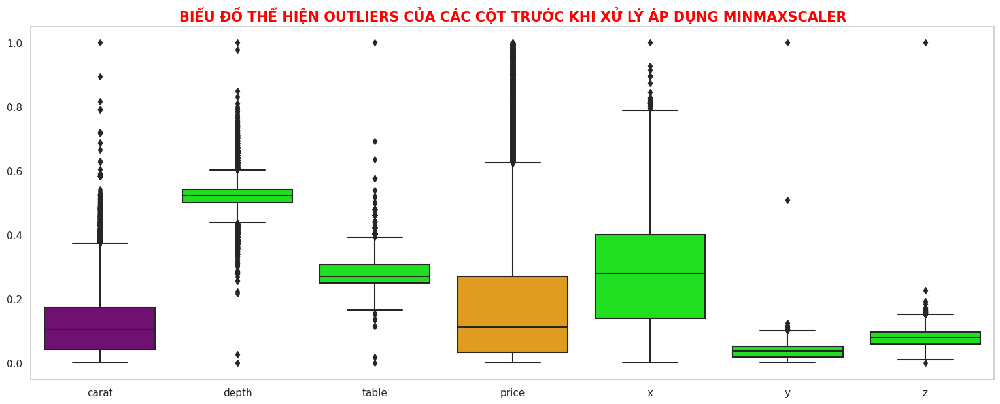

In [ ]:
# Biểu diễn trực quan outliers của tất cả các features
scaler = MinMaxScaler()
numerical_cols = processed_df.columns[processed_df.dtypes != 'object']
numerical_data = processed_df[numerical_cols]

sa = scaler.fit_transform(numerical_data)
sd = pd.DataFrame(sa,columns=numerical_data.columns)
boxplot_palette = {'depth':'lime', 'y':'lime', 'table':'lime', 'z':'lime', 'x':'lime','price':'orange','carat':'purple'}

plt.subplots(figsize = (19,7))
sns.boxplot(data = sd, palette=boxplot_palette)
plt.title('BIỂU ĐỒ THỂ HIỆN OUTLIERS CỦA CÁC CỘT TRƯỚC KHI XỬ LÝ ÁP DỤNG MINMAXSCALER',fontsize=15,color = 'red',fontweight='bold')
plt.grid(False)
plt.show()

In [ ]:
# Xử lý outliers
## Nhận diện outliers
def detect_outliers(df,features):
    outlier_indices = []

    for c in features:
        # 1st quartile
        Q1 = np.percentile(df[c],25)
        # 3rd quartile
        Q3 = np.percentile(df[c],75)
        # IQR
        IQR = Q3 - Q1
        # Outlier step
        outlier_step = IQR * 1.5
        # detect outlier and their indices
        outlier_list_col = df[(df[c] < Q1 - outlier_step) | (df[c] > Q3 + outlier_step)].index
        # store indices
        outlier_indices.extend(outlier_list_col)

    outlier_indices = Counter(outlier_indices)
    multiple_outliers = list(i for i, v in outlier_indices.items() if v > 2)

    return multiple_outliers

## Xử lý outliers
numerical_cols = list(processed_df.dtypes[processed_df.dtypes!='object'].index)
for feature in numerical_cols:
    q1 = processed_df[feature].quantile(0.25)
    q3 = processed_df[feature].quantile(0.75)
    iqr = q3 - q1
    lower_bound = q1 - 1.5 * iqr
    upper_bound = q3 + 1.5 * iqr
    processed_df = processed_df[(processed_df[feature]>=lower_bound) & (processed_df[feature]<=upper_bound)]

In [ ]:
processed_df.loc[detect_outliers(processed_df,['carat', 'depth', 'table', 'x', 'y', 'z', 'price'])]

,carat,depth,table,price,x,y,z,color,clarity,cut


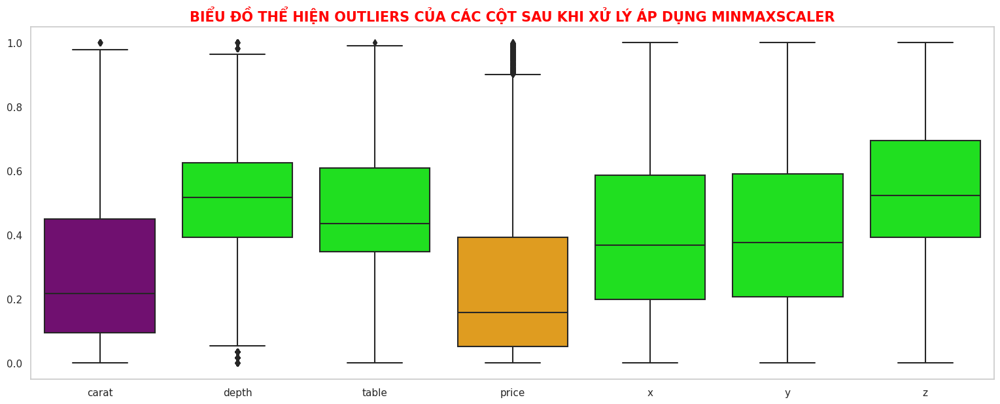

In [ ]:
scaler = MinMaxScaler()
numerical_data = processed_df[processed_df.columns[processed_df.dtypes != 'object']]
sa = scaler.fit_transform(numerical_data)
sd = pd.DataFrame(sa,columns=numerical_data.columns)
plt.subplots(figsize = (19,7))
sns.boxplot(data = sd, palette=boxplot_palette)
plt.title('BIỂU ĐỒ THỂ HIỆN OUTLIERS CỦA CÁC CỘT SAU KHI XỬ LÝ ÁP DỤNG MINMAXSCALER',fontsize=15,color = 'red',fontweight='bold')
plt.grid(False)
plt.show()

#**Phân tích đơn biến**

##*Price*

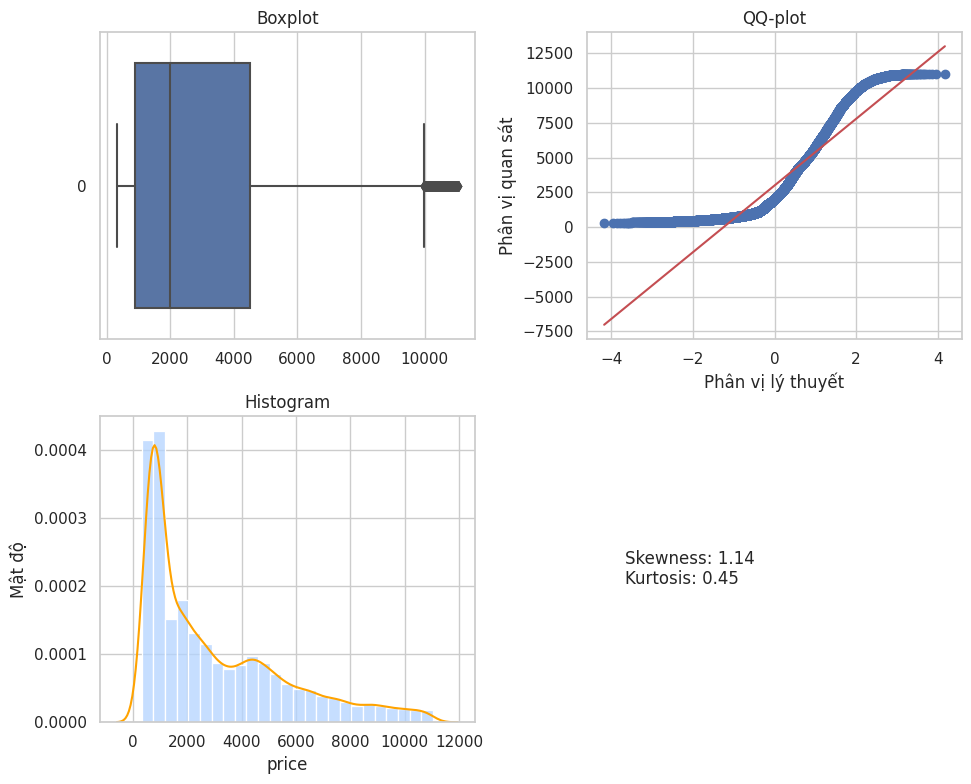

In [ ]:
# vẽ biểu đồ nhận xét
fig, axes = plt.subplots(2, 2, figsize=(10, 8))
# Boxplot
sns.boxplot(processed_df.price, orient='h', ax=axes[0, 0])
axes[0, 0].set_title('Boxplot')

# QQ-plot
stats.probplot(processed_df.price, plot=axes[0, 1])
axes[0, 1].set_title('QQ-plot')
axes[0, 1].set_xlabel('Phân vị lý thuyết')
axes[0, 1].set_ylabel('Phân vị quan sát')

# Histogram kèm đường KDE
sns.histplot(processed_df.price, bins = 25, color = '#b3d4ff',stat='density', edgecolor='white', ax=axes[1, 0])
sns.kdeplot(processed_df.price,color='#ffa300',ax=axes[1, 0])
axes[1, 0].set_title('Histogram')
axes[1, 0].set_ylabel('Mật độ')

# Hiển thị biểu đồ
plt.tight_layout()

# In skewness và kurtosis vào ô [1, 1]
skewness = stats.skew(processed_df.price)
kurtosis = stats.kurtosis(processed_df.price)
skew_kurt_text = f"Skewness: {skewness:.2f}\nKurtosis: {kurtosis:.2f}"
axes[1, 1].text(0.1, 0.5, skew_kurt_text, ha='left', va='center', fontsize=12)
axes[1, 1].get_xaxis().set_visible(False)
axes[1, 1].get_yaxis().set_visible(False)
axes[1, 1].spines['top'].set_visible(False)
axes[1, 1].spines['right'].set_visible(False)
axes[1, 1].spines['bottom'].set_visible(False)
axes[1, 1].spines['left'].set_visible(False)

plt.subplots_adjust(wspace=0.3)
plt.savefig('/content/gdrive/My Drive/dataviz_project/univariate_price.jpg')
plt.show()


##*Carat*

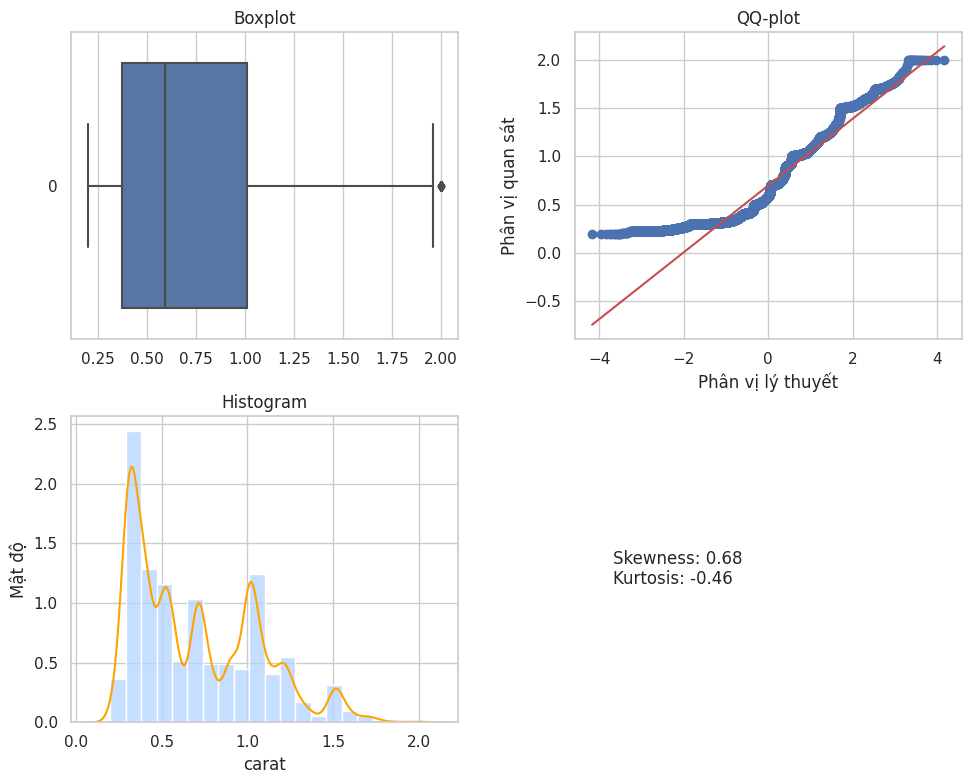

In [ ]:
# vẽ biểu đồ nhận xét
fig, axes = plt.subplots(2, 2, figsize=(10, 8))
# Boxplot
sns.boxplot(processed_df.carat, orient='h', ax=axes[0, 0])
axes[0, 0].set_title('Boxplot')

# QQ-plot
stats.probplot(processed_df.carat, plot=axes[0, 1])
axes[0, 1].set_title('QQ-plot')
axes[0, 1].set_xlabel('Phân vị lý thuyết')
axes[0, 1].set_ylabel('Phân vị quan sát')

# Histogram kèm đường KDE
sns.histplot(processed_df.carat, bins=20, color = '#b3d4ff',stat='density', edgecolor='white', ax=axes[1, 0])
sns.kdeplot(processed_df.carat,color='#ffa300',ax=axes[1, 0])
axes[1, 0].set_title('Histogram')
axes[1, 0].set_ylabel('Mật độ')

# Hiển thị biểu đồ
plt.tight_layout()

# In skewness và kurtosis vào ô [1, 1]
skewness = stats.skew(processed_df.carat)
kurtosis = stats.kurtosis(processed_df.carat)
skew_kurt_text = f"Skewness: {skewness:.2f}\nKurtosis: {kurtosis:.2f}"
axes[1, 1].text(0.1, 0.5, skew_kurt_text, ha='left', va='center', fontsize=12)
axes[1, 1].get_xaxis().set_visible(False)
axes[1, 1].get_yaxis().set_visible(False)
axes[1, 1].spines['top'].set_visible(False)
axes[1, 1].spines['right'].set_visible(False)
axes[1, 1].spines['bottom'].set_visible(False)
axes[1, 1].spines['left'].set_visible(False)

plt.subplots_adjust(wspace=0.3)
plt.savefig('/content/gdrive/My Drive/dataviz_project/univariate_carat.jpg')
plt.grid(False)
plt.show()

##*x*

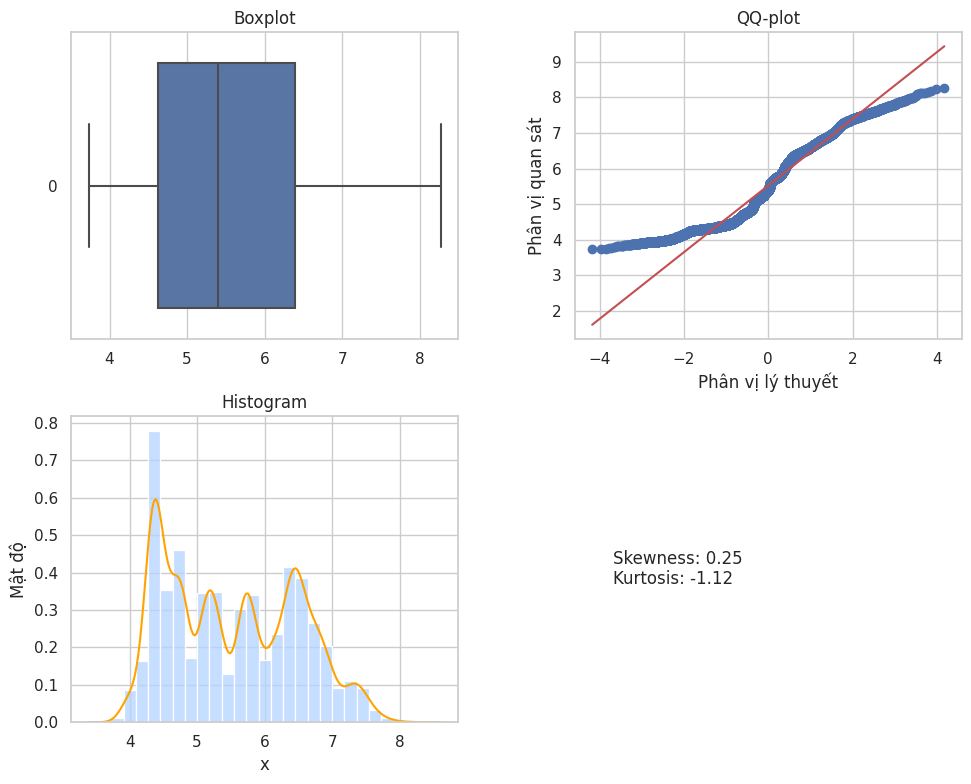

In [ ]:
# vẽ biểu đồ nhận xét
fig, axes = plt.subplots(2, 2, figsize=(10, 8))
# Boxplot
sns.boxplot(processed_df.x, orient='h', ax=axes[0, 0])
axes[0, 0].set_title('Boxplot')

# QQ-plot
stats.probplot(processed_df.x, plot=axes[0, 1])
axes[0, 1].set_title('QQ-plot')
axes[0, 1].set_xlabel('Phân vị lý thuyết')
axes[0, 1].set_ylabel('Phân vị quan sát')

# Histogram kèm đường KDE
sns.histplot(processed_df.x, bins = 25, color = '#b3d4ff',stat='density', edgecolor='white', ax=axes[1, 0])
sns.kdeplot(processed_df.x,color='#ffa300',ax=axes[1, 0])
axes[1, 0].set_title('Histogram')
axes[1, 0].set_ylabel('Mật độ')

# Hiển thị biểu đồ
plt.tight_layout()

# In skewness và kurtosis vào ô [1, 1]
skewness = stats.skew(processed_df.x)
kurtosis = stats.kurtosis(processed_df.x)
skew_kurt_text = f"Skewness: {skewness:.2f}\nKurtosis: {kurtosis:.2f}"
axes[1, 1].text(0.1, 0.5, skew_kurt_text, ha='left', va='center', fontsize=12)
axes[1, 1].get_xaxis().set_visible(False)
axes[1, 1].get_yaxis().set_visible(False)
axes[1, 1].spines['top'].set_visible(False)
axes[1, 1].spines['right'].set_visible(False)
axes[1, 1].spines['bottom'].set_visible(False)
axes[1, 1].spines['left'].set_visible(False)

plt.subplots_adjust(wspace=0.3)
plt.savefig('/content/gdrive/My Drive/dataviz_project/univariate_x.jpg')
plt.grid(False)
plt.show()


##*y*

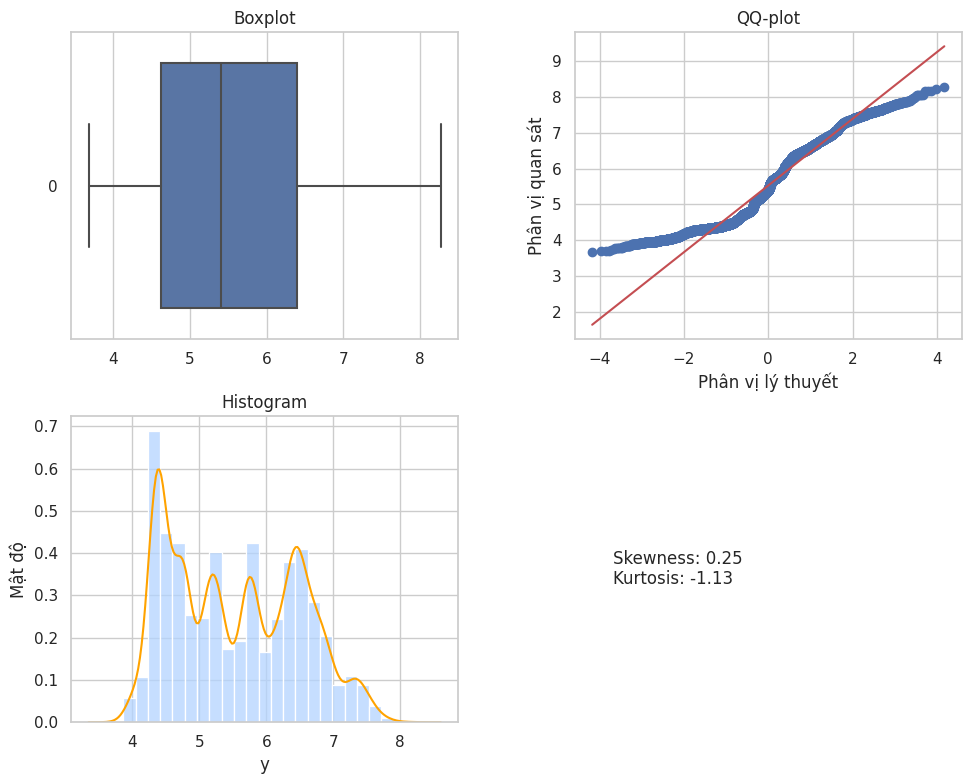

In [ ]:
# vẽ biểu đồ nhận xét
fig, axes = plt.subplots(2, 2, figsize=(10, 8))
# Boxplot
sns.boxplot(processed_df.y, orient='h', ax=axes[0, 0])
axes[0, 0].set_title('Boxplot')

# QQ-plot
stats.probplot(processed_df.y, plot=axes[0, 1])
axes[0, 1].set_title('QQ-plot')
axes[0, 1].set_xlabel('Phân vị lý thuyết')
axes[0, 1].set_ylabel('Phân vị quan sát')

# Histogram kèm đường KDE
sns.histplot(processed_df.y, bins = 25, color = '#b3d4ff',stat='density', edgecolor='white', ax=axes[1, 0])
sns.kdeplot(processed_df.y,color='#ffa300',ax=axes[1, 0])
axes[1, 0].set_title('Histogram')
axes[1, 0].set_ylabel('Mật độ')

# Hiển thị biểu đồ
plt.tight_layout()

# In skewness và kurtosis vào ô [1, 1]
skewness = stats.skew(processed_df.y)
kurtosis = stats.kurtosis(processed_df.y)
skew_kurt_text = f"Skewness: {skewness:.2f}\nKurtosis: {kurtosis:.2f}"
axes[1, 1].text(0.1, 0.5, skew_kurt_text, ha='left', va='center', fontsize=12)
axes[1, 1].get_xaxis().set_visible(False)
axes[1, 1].get_yaxis().set_visible(False)
axes[1, 1].spines['top'].set_visible(False)
axes[1, 1].spines['right'].set_visible(False)
axes[1, 1].spines['bottom'].set_visible(False)
axes[1, 1].spines['left'].set_visible(False)
plt.subplots_adjust(wspace=0.3)
plt.savefig('/content/gdrive/My Drive/dataviz_project/univariate_y.jpg')
plt.grid(False)
plt.show()


##*z*

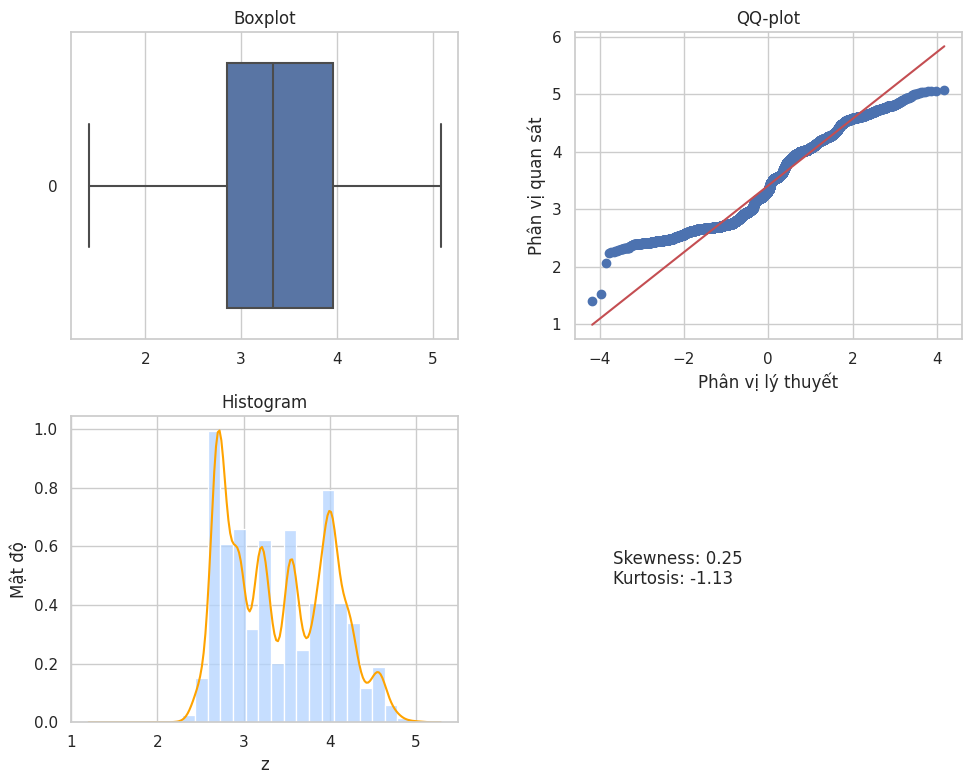

In [ ]:
# vẽ biểu đồ nhận xét
fig, axes = plt.subplots(2, 2, figsize=(10, 8))
# Boxplot
sns.boxplot(processed_df.z, orient='h', ax=axes[0, 0])
axes[0, 0].set_title('Boxplot')

# QQ-plot
stats.probplot(processed_df.z, plot=axes[0, 1])
axes[0, 1].set_title('QQ-plot')
axes[0, 1].set_xlabel('Phân vị lý thuyết')
axes[0, 1].set_ylabel('Phân vị quan sát')

# Histogram kèm đường KDE
sns.histplot(processed_df.z, bins = 25, color = '#b3d4ff',stat='density', edgecolor='white', ax=axes[1, 0])
sns.kdeplot(processed_df.z,color='#ffa300',ax=axes[1, 0])
axes[1, 0].set_title('Histogram')
axes[1, 0].set_ylabel('Mật độ')

# Hiển thị biểu đồ
plt.tight_layout()

# In skewness và kurtosis vào ô [1, 1]
skewness = stats.skew(processed_df.z)
kurtosis = stats.kurtosis(processed_df.z)
skew_kurt_text = f"Skewness: {skewness:.2f}\nKurtosis: {kurtosis:.2f}"
axes[1, 1].text(0.1, 0.5, skew_kurt_text, ha='left', va='center', fontsize=12)
axes[1, 1].get_xaxis().set_visible(False)
axes[1, 1].get_yaxis().set_visible(False)
axes[1, 1].spines['top'].set_visible(False)
axes[1, 1].spines['right'].set_visible(False)
axes[1, 1].spines['bottom'].set_visible(False)
axes[1, 1].spines['left'].set_visible(False)

plt.subplots_adjust(wspace=0.3)
plt.savefig('/content/gdrive/My Drive/dataviz_project/univariate_z.jpg')
plt.grid(False)
plt.show()


##*Depth*

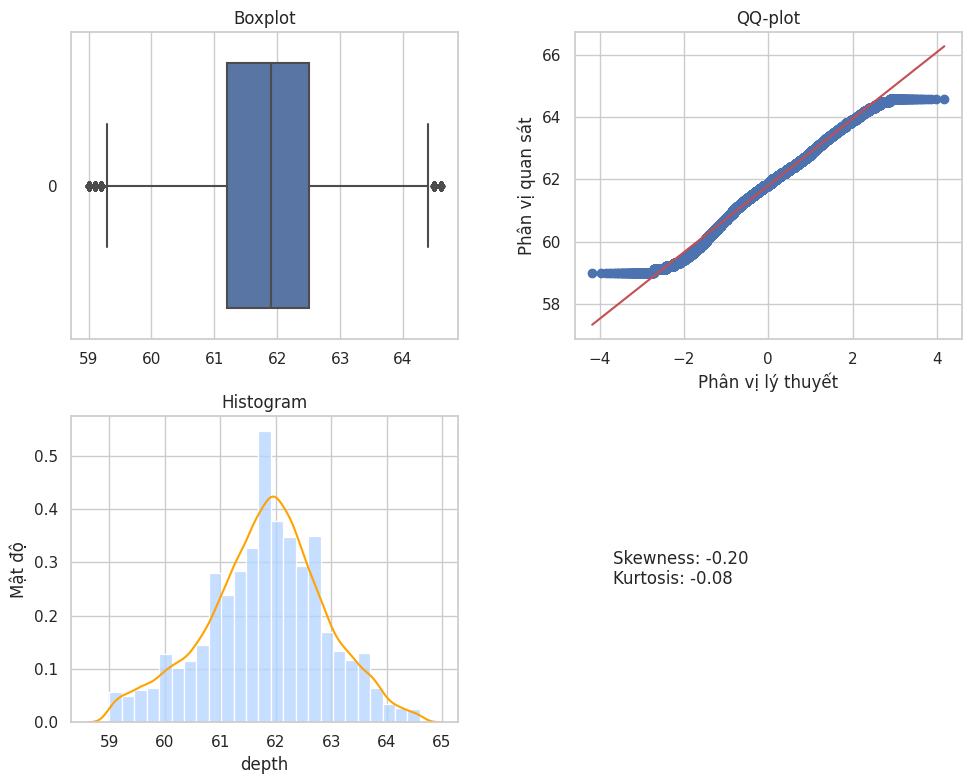

In [ ]:
# vẽ biểu đồ nhận xét
fig, axes = plt.subplots(2, 2, figsize=(10, 8))
# Boxplot
sns.boxplot(processed_df.depth, orient='h', ax=axes[0, 0])
axes[0, 0].set_title('Boxplot')

# QQ-plot
stats.probplot(processed_df.depth, plot=axes[0, 1])
axes[0, 1].set_title('QQ-plot')
axes[0, 1].set_xlabel('Phân vị lý thuyết')
axes[0, 1].set_ylabel('Phân vị quan sát')

# Histogram kèm đường KDE
sns.histplot(processed_df.depth, bins = 25, color = '#b3d4ff',stat='density', edgecolor='white', ax=axes[1, 0])
sns.kdeplot(processed_df.depth,color='#ffa300',ax=axes[1, 0])
axes[1, 0].set_title('Histogram')
axes[1, 0].set_ylabel('Mật độ')

# Hiển thị biểu đồ
plt.tight_layout()

# In skewness và kurtosis vào ô [1, 1]
skewness = stats.skew(processed_df.depth)
kurtosis = stats.kurtosis(processed_df.depth)
skew_kurt_text = f"Skewness: {skewness:.2f}\nKurtosis: {kurtosis:.2f}"
axes[1, 1].text(0.1, 0.5, skew_kurt_text, ha='left', va='center', fontsize=12)
axes[1, 1].get_xaxis().set_visible(False)
axes[1, 1].get_yaxis().set_visible(False)
axes[1, 1].spines['top'].set_visible(False)
axes[1, 1].spines['right'].set_visible(False)
axes[1, 1].spines['bottom'].set_visible(False)
axes[1, 1].spines['left'].set_visible(False)

plt.subplots_adjust(wspace=0.3)
plt.savefig('/content/gdrive/My Drive/dataviz_project/univariate_depth.jpg')
plt.grid(False)
plt.show()


##*Table*

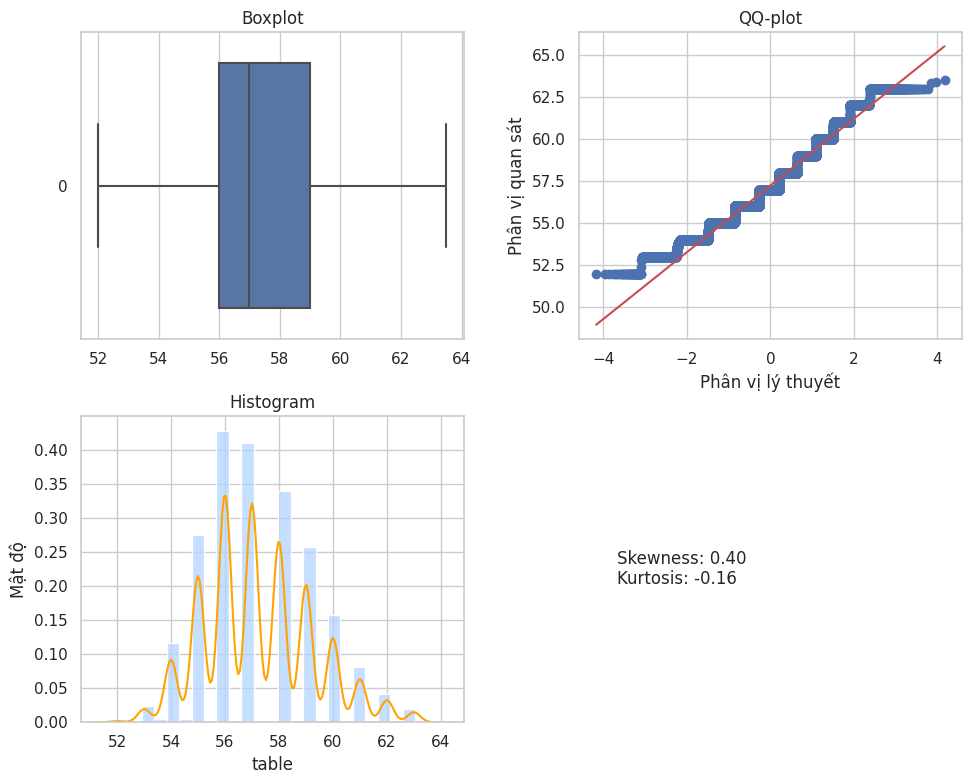

In [ ]:
# vẽ biểu đồ nhận xét
fig, axes = plt.subplots(2, 2, figsize=(10, 8))
# Boxplot
sns.boxplot(processed_df.table, orient='h', ax=axes[0, 0])
axes[0, 0].set_title('Boxplot')

# QQ-plot
stats.probplot(processed_df.table, plot=axes[0, 1])
axes[0, 1].set_title('QQ-plot')
axes[0, 1].set_xlabel('Phân vị lý thuyết')
axes[0, 1].set_ylabel('Phân vị quan sát')

# Histogram kèm đường KDE
sns.histplot(processed_df.table, bins = 25, color = '#b3d4ff',stat='density', edgecolor='white', ax=axes[1, 0])
sns.kdeplot(processed_df.table,color='#ffa300',ax=axes[1, 0])
axes[1, 0].set_title('Histogram')
axes[1, 0].set_ylabel('Mật độ')

# Hiển thị biểu đồ
plt.tight_layout()

# In skewness và kurtosis vào ô [1, 1]
skewness = stats.skew(processed_df.table)
kurtosis = stats.kurtosis(processed_df.table)
skew_kurt_text = f"Skewness: {skewness:.2f}\nKurtosis: {kurtosis:.2f}"
axes[1, 1].text(0.1, 0.5, skew_kurt_text, ha='left', va='center', fontsize=12)
axes[1, 1].get_xaxis().set_visible(False)
axes[1, 1].get_yaxis().set_visible(False)
axes[1, 1].spines['top'].set_visible(False)
axes[1, 1].spines['right'].set_visible(False)
axes[1, 1].spines['bottom'].set_visible(False)
axes[1, 1].spines['left'].set_visible(False)

plt.subplots_adjust(wspace=0.3)
plt.savefig('/content/gdrive/My Drive/dataviz_project/univariate_table.jpg')
plt.grid(False)
plt.show()


##*Clarity*

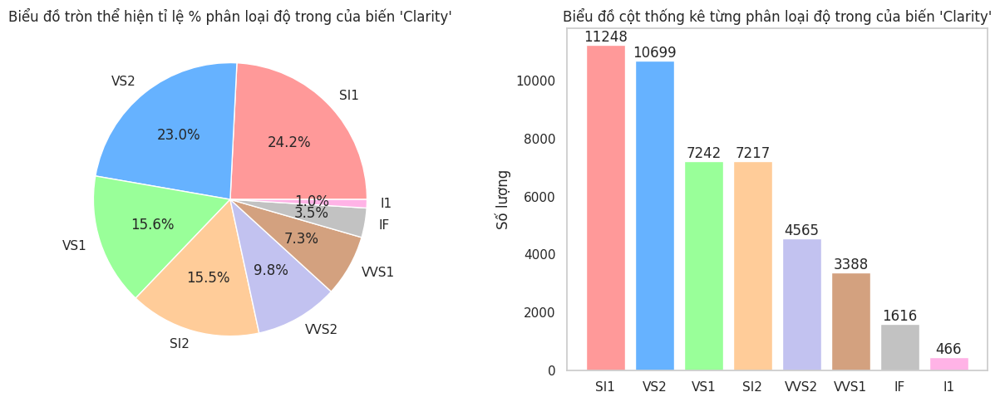

In [ ]:
import matplotlib.pyplot as plt

# Dữ liệu ví dụ
categories = processed_df.clarity.value_counts().keys()
counts = processed_df.clarity.value_counts().values

# Tính tổng số lượng
total_counts = sum(counts)

# Màu pastel
pastel_colors = ['#FF9999', '#66B2FF', '#99FF99', '#FFCC99', '#C2C2F0', '#D3A17F', '#C2C2C2', '#FFB3E6']

# Tạo một figure và axes cho biểu đồ
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 5))

# Vẽ biểu đồ tròn (Pie chart) với màu pastel
ax1.pie(counts, labels=categories, colors=pastel_colors, autopct='%1.1f%%')
ax1.set_title('Biểu đồ tròn thể hiện tỉ lệ % phân loại độ trong của biến \'Clarity\'')

# Vẽ biểu đồ cột (Bar chart) với màu pastel
ax2.bar(categories, counts, color=pastel_colors)
ax2.set_title('Biểu đồ cột thống kê từng phân loại độ trong của biến \'Clarity\'')
ax2.set_ylabel('Số lượng')

# Hiển thị số lượng cụ thể trên mỗi bar trong biểu đồ cột
for i, v in enumerate(counts):
    ax2.text(i, v, str(v), ha='center', va='bottom')

# Hiển thị biểu đồ
plt.tight_layout()
plt.subplots_adjust(wspace=0.3)
plt.savefig('/content/gdrive/My Drive/dataviz_project/univariate_clarity.jpg')
plt.grid(False)
plt.show()

##*Cut*

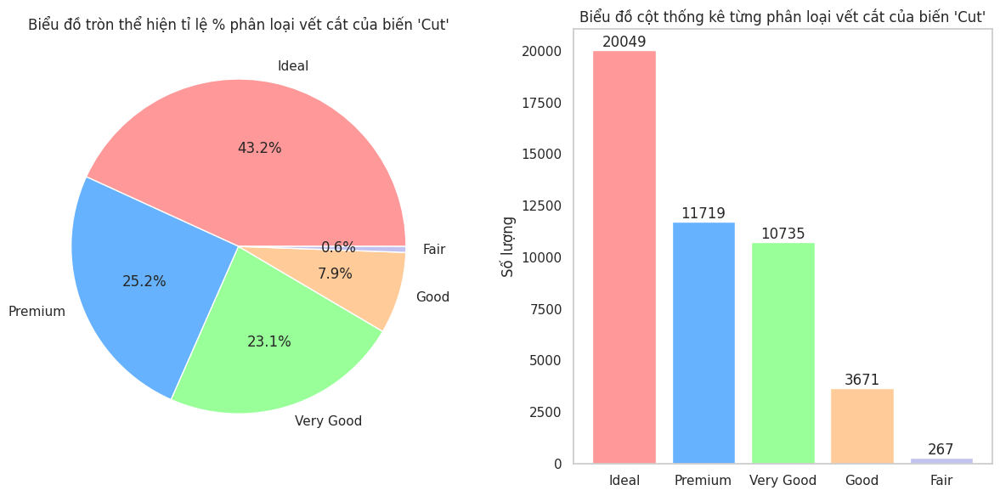

In [ ]:
# Dữ liệu ví dụ
categories = processed_df.cut.value_counts().keys()
counts = processed_df.cut.value_counts().values

# Tính tổng số lượng
total_counts = sum(counts)

# Màu pastel
pastel_colors = ['#FF9999', '#66B2FF', '#99FF99', '#FFCC99', '#C2C2F0', '#D3A17F', '#C2C2C2', '#FFB3E6']

# Tạo một figure và axes cho biểu đồ
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 6))

# Vẽ biểu đồ tròn (Pie chart) với màu pastel
ax1.pie(counts, labels=categories, colors=pastel_colors, autopct='%1.1f%%')
ax1.set_title('Biểu đồ tròn thể hiện tỉ lệ % phân loại vết cắt của biến \'Cut\'')

# Vẽ biểu đồ cột (Bar chart) với màu pastel
ax2.bar(categories, counts, color=pastel_colors)
ax2.set_title('Biểu đồ cột thống kê từng phân loại vết cắt của biến \'Cut\'')
ax2.set_ylabel('Số lượng')

# Hiển thị số lượng cụ thể trên mỗi bar trong biểu đồ cột
for i, v in enumerate(counts):
    ax2.text(i, v, str(v), ha='center', va='bottom')

# Hiển thị biểu đồ
plt.tight_layout()
plt.subplots_adjust(wspace=0.3)
plt.savefig('/content/gdrive/My Drive/dataviz_project/univariate_cut.jpg')
plt.grid(False)
plt.show()

##*Color*

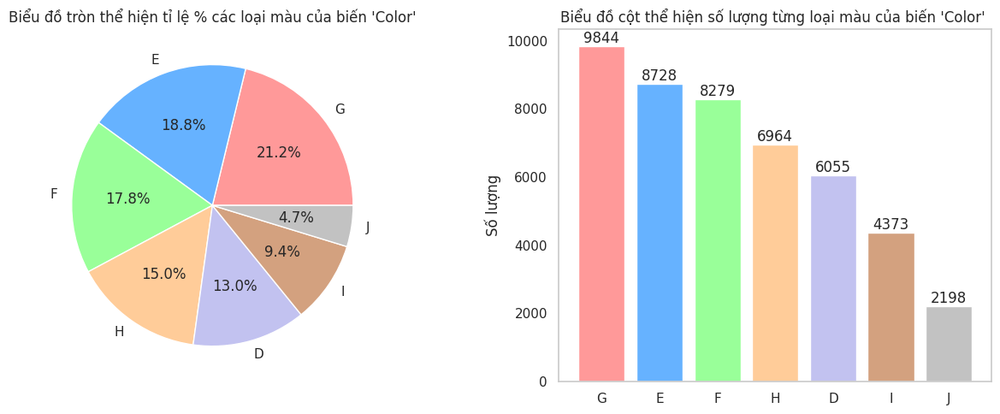

In [ ]:
# Dữ liệu ví dụ
categories = processed_df.color.value_counts().keys()
counts = processed_df.color.value_counts().values

# Tính tổng số lượng
total_counts = sum(counts)

# Màu pastel
pastel_colors = ['#FF9999', '#66B2FF', '#99FF99', '#FFCC99', '#C2C2F0', '#D3A17F', '#C2C2C2', '#FFB3E6']

# Tạo một figure và axes cho biểu đồ
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 5))

# Vẽ biểu đồ tròn (Pie chart) với màu pastel
ax1.pie(counts, labels=categories, colors=pastel_colors, autopct='%1.1f%%')
ax1.set_title('Biểu đồ tròn thể hiện tỉ lệ % các loại màu của biến \'Color\'')

# Vẽ biểu đồ cột (Bar chart) với màu pastel
ax2.bar(categories, counts, color=pastel_colors)
ax2.set_title('Biểu đồ cột thể hiện số lượng từng loại màu của biến \'Color\' ')
ax2.set_ylabel('Số lượng')

# Hiển thị số lượng cụ thể trên mỗi bar trong biểu đồ cột
for i, v in enumerate(counts):
    ax2.text(i, v, str(v), ha='center', va='bottom')

# Hiển thị biểu đồ
plt.tight_layout()
plt.subplots_adjust(wspace=0.3)
plt.savefig('/content/gdrive/My Drive/dataviz_project/univariate_color.jpg')
plt.grid(False)
plt.show()

#**Kiểm định giả thuyết**

##*2 biến*

###*Kiếm định Chi bình phương về mối tương quan giữa hai biến categorical*

In [ ]:
cut = processed_df['cut']
color = processed_df['color']
clarity = processed_df['clarity']

# cut_color crosstab
cut_color = pd.crosstab(cut,color)
cut_clarity = pd.crosstab(cut,clarity)
color_clarity = pd.crosstab(color,clarity)

# Kiểm định chi bình phương mối tương quan giữa cut và color
_, p ,_,_ = chi2_contingency(cut_color)
print('Giả thuyết H0: Không có mối quan hệ hoặc không có sự tương quan giữa biến \'Cut\' và \'Color\'.')
print('Giả thuyết H1: Có mối quan hệ hoặc có sự tương quan giữa biến \'Cut\' và \'Color\'.')
if p < 0.05:
  print('Bác bỏ H0')
  print('Hai biến \'Cut\' và \'Color\' có mối quan hệ với nhau')
else:
  print('Chấp nhận H0')
  print('Không đủ bằng chứng để kết luận hai biến \'Cut\' và \'Color\' có mối quan hệ với nhau')

Giả thuyết H0: Không có mối quan hệ hoặc không có sự tương quan giữa biến 'Cut' và 'Color'.
Giả thuyết H1: Có mối quan hệ hoặc có sự tương quan giữa biến 'Cut' và 'Color'.
Bác bỏ H0
Hai biến 'Cut' và 'Color' có mối quan hệ với nhau


In [ ]:
# Kiểm định chi bình phương mối tương quan giữa cut và clarity
_, p ,_,_ = chi2_contingency(cut_clarity)
print('Giả thuyết H0: Không có mối quan hệ hoặc không có sự tương quan giữa biến \'Cut\' và \'Clarity\'.')
print('Giả thuyết H1: Có mối quan hệ hoặc có sự tương quan giữa biến \'Cut\' và \'Clarity\'.')
if p < 0.05:
  print('Bác bỏ H0')
  print('Hai biến \'Cut\' và \'Clarity\' có mối quan hệ với nhau')
else:
  print('Chấp nhận H0')
  print('Không đủ bằng chứng để kết luận hai biến \'Cut\' và \'Clarity\' có mối quan hệ với nhau')

Giả thuyết H0: Không có mối quan hệ hoặc không có sự tương quan giữa biến 'Cut' và 'Clarity'.
Giả thuyết H1: Có mối quan hệ hoặc có sự tương quan giữa biến 'Cut' và 'Clarity'.
Bác bỏ H0
Hai biến 'Cut' và 'Clarity' có mối quan hệ với nhau


In [ ]:
# Kiểm định chi bình phương mối tương quan giữa color và clarity
_, p ,_,_ = chi2_contingency(color_clarity)
print('Giả thuyết H0: Không có mối quan hệ hoặc không có sự tương quan giữa biến \'Color\' và \'Clarity\'.')
print('Giả thuyết H1: Có mối quan hệ hoặc có sự tương quan giữa biến \'Color\' và \'Clarity\'.')
if p < 0.05:
  print('Bác bỏ H0')
  print('Hai biến \'Color\' và \'Clarity\' có mối quan hệ với nhau')
else:
  print('Chấp nhận H0')
  print('Không đủ bằng chứng để kết luận hai biến \'Color\' và \'Clarity\' có mối quan hệ với nhau')

Giả thuyết H0: Không có mối quan hệ hoặc không có sự tương quan giữa biến 'Color' và 'Clarity'.
Giả thuyết H1: Có mối quan hệ hoặc có sự tương quan giữa biến 'Color' và 'Clarity'.
Bác bỏ H0
Hai biến 'Color' và 'Clarity' có mối quan hệ với nhau


###*Kiểm định ANOVA 1 chiều về mối tương quan giữa 1 biến numeric và 1 biến categorical*

In [ ]:
# Anova 1_way Price vs Cut
df=processed_df[['cut', 'price']]
ideal=df[df['cut']=='Ideal']['price']
premium=df[df['cut']=='Premium']['price']
very_good=df[df['cut']=='Very Good']['price']
good=df[df['cut']=='Good']['price']
fair=df[df['cut']=='Fair']['price']

f, p = stats.f_oneway(ideal, premium, very_good, good, fair)
print('H0:Không có sự khác biệt về giá giữa các loại vết cắt')
print('Ha:Có sự khác biệt về giá giữa các loại vết cắt')
alpha = 0.05
if (p < alpha):
  print(f'Trị số p = {p:.4f} < {alpha:.4f} cho nên bác bỏ H0')

else:
  print(f'Trị số p = {p:.4f} >= {alpha:.4f} không nên bác bỏ H0')

H0:Không có sự khác biệt về giá giữa các loại vết cắt
Ha:Có sự khác biệt về giá giữa các loại vết cắt
Trị số p = 0.0000 < 0.0500 cho nên bác bỏ H0


##*3 biến*

###*Kiểm định ANOVA 2 chiều về mối tương quan giữa 2 biến categorical và 1 biến numeric*

In [ ]:
# Price Vs Clarity and Cut
viz = processed_df.copy()
# Tạo mô hình ANOVA 2 chiều
pr_cl_ct = ols('price ~ C(cut) + C(clarity) + C(cut):C(clarity)', data=viz).fit()

# Kiểm định ANOVA
anova_table = sm.stats.anova_lm(pr_cl_ct, typ=2)

# In ra giả thuyết H0, H1
print('Giả thuyết H0: Không có sự khác biệt có ý nghĩa thống kê về giá trung bình của kim cương giữa các mức cắt và độ tinh khiết.')
print('Giả thuyết H1: Có sự khác biệt có ý nghĩa thống kê về giá trung bình của kim cương giữa các mức cắt và độ tinh khiết.')

# In ra bảng ANOVA 2 chiều
print('Bảng ANOVA 2 chiều:')
print(anova_table)

# Danh sách các điều kiện
conditions = [
    ("Cut", 'C(cut)'),
    ("Clarity", 'C(clarity)'),
    ("Tương tác giữa Cut và Clarity", 'C(cut):C(clarity)')
]

# Kiểm tra từng điều kiện
print('\nPhân tích kết quả:')
for condition, col in conditions:
    p_value = anova_table.loc[col, 'PR(>F)']
    if p_value < 0.05:
        print(f"{condition} ảnh hưởng đến giá trị 'price'."
              f" Có sự khác biệt ý nghĩa thống kê với giá trị 'price'.")
    else:
        print(f"Không có sự khác biệt ý nghĩa thống kê với giá trị 'price' qua {condition}.")


Giả thuyết H0: Không có sự khác biệt có ý nghĩa thống kê về giá trung bình của kim cương giữa các mức cắt và độ tinh khiết.
Giả thuyết H1: Có sự khác biệt có ý nghĩa thống kê về giá trung bình của kim cương giữa các mức cắt và độ tinh khiết.
Bảng ANOVA 2 chiều:
                         sum_sq       df           F         PR(>F)
C(cut)             1.823743e+09      4.0   70.324342   1.778551e-59
C(clarity)         7.950746e+09      7.0  175.190983  3.831889e-257
C(cut):C(clarity)  1.360799e+09     28.0    7.496144   1.087861e-29
Residual           3.008330e+11  46401.0         NaN            NaN

Phân tích kết quả:
Cut ảnh hưởng đến giá trị 'price'. Có sự khác biệt ý nghĩa thống kê với giá trị 'price'.
Clarity ảnh hưởng đến giá trị 'price'. Có sự khác biệt ý nghĩa thống kê với giá trị 'price'.
Tương tác giữa Cut và Clarity ảnh hưởng đến giá trị 'price'. Có sự khác biệt ý nghĩa thống kê với giá trị 'price'.


In [ ]:
# Price vs Clarity và Color
# Tạo mô hình ANOVA 2 chiều
pr_cl_cr = ols('price ~ C(color) + C(clarity) + C(color):C(clarity)', data=viz).fit()

# Kiểm định ANOVA
anova_table = sm.stats.anova_lm(pr_cl_cr, typ=2)

# In ra giả thuyết H0, H1
print('Giả thuyết H0: Không có sự khác biệt có ý nghĩa thống kê về giá trung bình của kim cương giữa độ tinh khiết và màu sắc.')
print('Giả thuyết H1: Có sự khác biệt có ý nghĩa thống kê về giá trung bình của kim cương giữa độ tinh khiết và màu sắc.')

# In ra bảng ANOVA 2 chiều
print('Bảng ANOVA 2 chiều:')
print(anova_table)

# Danh sách các điều kiện
conditions = [
    ("Color", 'C(color)'),
    ("Clarity", 'C(clarity)'),
    ("Tương tác giữa Color và Clarity", 'C(color):C(clarity)')
]

# Kiểm tra từng điều kiện
print('\nPhân tích kết quả:')
for condition, col in conditions:
    p_value = anova_table.loc[col, 'PR(>F)']
    if p_value < 0.05:
        print(f"{condition} ảnh hưởng đến giá trị 'price'."
              f" Có sự khác biệt ý nghĩa thống kê với giá trị 'price'.")
    else:
        print(f"Không có sự khác biệt ý nghĩa thống kê với giá trị 'price' qua {condition}.")


Giả thuyết H0: Không có sự khác biệt có ý nghĩa thống kê về giá trung bình của kim cương giữa độ tinh khiết và màu sắc.
Giả thuyết H1: Có sự khác biệt có ý nghĩa thống kê về giá trung bình của kim cương giữa độ tinh khiết và màu sắc.
Bảng ANOVA 2 chiều:
                           sum_sq       df           F         PR(>F)
C(color)             7.945980e+09      6.0  210.233533  1.059634e-265
C(clarity)           1.052722e+10      7.0  238.737914   0.000000e+00
C(color):C(clarity)  3.877182e+09     42.0   14.654555  3.333872e-102
Residual             2.921943e+11  46385.0         NaN            NaN

Phân tích kết quả:
Color ảnh hưởng đến giá trị 'price'. Có sự khác biệt ý nghĩa thống kê với giá trị 'price'.
Clarity ảnh hưởng đến giá trị 'price'. Có sự khác biệt ý nghĩa thống kê với giá trị 'price'.
Tương tác giữa Color và Clarity ảnh hưởng đến giá trị 'price'. Có sự khác biệt ý nghĩa thống kê với giá trị 'price'.


In [ ]:
# Price vs Cut và Color
# Tạo mô hình ANOVA 2 chiều
pr_cr_ct = ols('price ~ C(color) + C(cut) + C(color):C(cut)', data=viz).fit()

# Kiểm định ANOVA
anova_table = sm.stats.anova_lm(pr_cr_ct, typ=2)

# In ra giả thuyết H0, H1
print('Giả thuyết H0: Không có sự khác biệt có ý nghĩa thống kê về giá trung bình của kim cương giữa các mức cắt và màu sắc.')
print('Giả thuyết H1: Có sự khác biệt có ý nghĩa thống kê về giá trung bình của kim cương giữa các mức cắt và màu sắc.')

# In ra bảng ANOVA 2 chiều
print('Bảng ANOVA 2 chiều:')
print(anova_table)

# Danh sách các điều kiện
conditions = [
    ("Color", 'C(color)'),
    ("Cut", 'C(cut)'),
    ("Tương tác giữa Color và Cut", 'C(color):C(cut)')
]

# Kiểm tra từng điều kiện
print('\nPhân tích kết quả:')
for condition, col in conditions:
    p_value = anova_table.loc[col, 'PR(>F)']
    if p_value < 0.05:
        print(f"{condition} ảnh hưởng đến giá trị 'price'."
              f" Có sự khác biệt ý nghĩa thống kê với giá trị 'price'.")
    else:
        print(f"Không có sự khác biệt ý nghĩa thống kê với giá trị 'price' qua {condition}.")


Giả thuyết H0: Không có sự khác biệt có ý nghĩa thống kê về giá trung bình của kim cương giữa các mức cắt và màu sắc.
Giả thuyết H1: Có sự khác biệt có ý nghĩa thống kê về giá trung bình của kim cương giữa các mức cắt và màu sắc.
Bảng ANOVA 2 chiều:
                       sum_sq       df           F         PR(>F)
C(color)         6.755796e+09      6.0  172.492787  6.930484e-218
C(cut)           3.210032e+09      4.0  122.940538  1.462058e-104
C(color):C(cut)  4.683689e+08     24.0    2.989665   1.199308e-06
Residual         3.029203e+11  46406.0         NaN            NaN

Phân tích kết quả:
Color ảnh hưởng đến giá trị 'price'. Có sự khác biệt ý nghĩa thống kê với giá trị 'price'.
Cut ảnh hưởng đến giá trị 'price'. Có sự khác biệt ý nghĩa thống kê với giá trị 'price'.
Tương tác giữa Color và Cut ảnh hưởng đến giá trị 'price'. Có sự khác biệt ý nghĩa thống kê với giá trị 'price'.


#**Phân tích hai biến**

##*Các biến categories ảnh hưởng đến giá của kim cương như thế nào?*

**1. Biến cut**

In [ ]:
result = processed_df.groupby('cut').agg(
    count=pd.NamedAgg(column='cut', aggfunc='size'),
    Min_Price=pd.NamedAgg(column='price', aggfunc='min'),
    Average_Price=pd.NamedAgg(column='price', aggfunc='mean'),
    Max_Price=pd.NamedAgg(column='price', aggfunc='max')
).reset_index()

result['percentage'] = 100 * round(result['count'] / result['count'].sum(), 3)

# Sắp xếp và chọn cột
result = result.sort_values(by='cut').reset_index(drop=True)
result = result[['cut', 'count', 'percentage', 'Min_Price', 'Average_Price', 'Max_Price']]

# Hiển thị bảng
print(tabulate(result, headers=["Diamond Cut", "Count", "Percentage", "Minimum Price", "Average Price", "Maximum Price"], tablefmt="pipe"))

|    | Diamond Cut   |   Count |   Percentage |   Minimum Price |   Average Price |   Maximum Price |
|---:|:--------------|--------:|-------------:|----------------:|----------------:|----------------:|
|  0 | Fair          |     267 |          0.6 |             496 |         3642.77 |           11007 |
|  1 | Good          |    3671 |          7.9 |             335 |         3140.11 |           11036 |
|  2 | Ideal         |   20049 |         43.2 |             326 |         2701.4  |           11040 |
|  3 | Premium       |   11719 |         25.2 |             326 |         3338.41 |           11037 |
|  4 | Very Good     |   10735 |         23.1 |             336 |         3127.26 |           11039 |


In [ ]:
cut_order = processed_df.groupby('cut')['price'].mean().sort_values(ascending=False).index

fig_box = px.box(processed_df, x='cut', y='price', color='cut', category_orders={'cut': cut_order}, points=False)
fig_box.update_traces(quartilemethod="exclusive")
fig_box.update_layout(title='Biểu đồ Boxplot giá kim cương theo loại vết cắt')
fig_box.show()

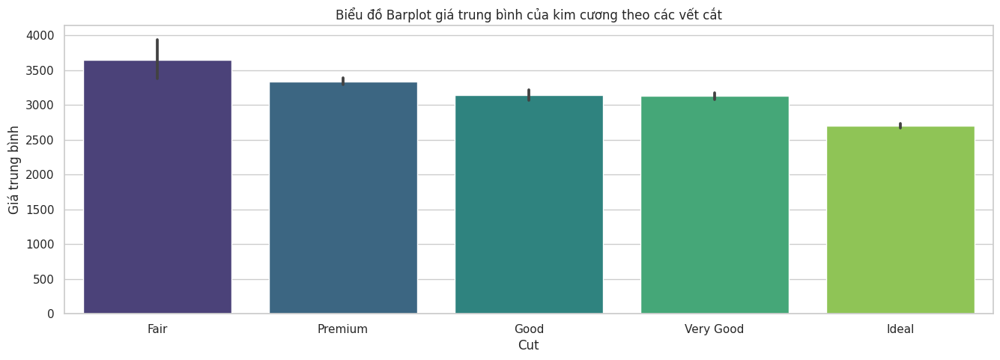

In [ ]:
fig, (ax1) = plt.subplots(1, figsize=(16, 5))
sns.barplot(x='cut', y='price', data=processed_df, ax=ax1, order=processed_df.groupby('cut')['price'].mean().sort_values(ascending=False).index, palette='viridis')
ax1.set(xlabel='Cut', ylabel='Giá trung bình')
ax1.set_title('Biểu đồ Barplot giá trung bình của kim cương theo các vết cắt')
plt.show()

**2. Biến Color**

In [ ]:
# Tạo bảng tổng hợp theo color
result = processed_df.groupby('color').agg(
    count=pd.NamedAgg(column='color', aggfunc='size'),
    Min_Price=pd.NamedAgg(column='price', aggfunc='min'),
    Average_Price=pd.NamedAgg(column='price', aggfunc='mean'),
    Max_Price=pd.NamedAgg(column='price', aggfunc='max')
).reset_index()

# Thêm cột percentage
result['percentage'] = 100 * round(result['count'] / result['count'].sum(), 3)

# Sắp xếp và chọn cột
result = result.sort_values(by='color').reset_index(drop=True)
result = result[['color', 'count', 'percentage', 'Min_Price', 'Average_Price', 'Max_Price']]

# Hiển thị bảng
table = tabulate(result, headers=["Index","Diamond Clarity", "Count", "Percentage", "Minimum Price", "Average Price", "Maximum Price"], tablefmt="pipe", colalign=('center', 'left', 'right', 'right', 'center', 'right', 'center'))
print(table)

|  Index  | Diamond Clarity   |   Count |   Percentage |  Minimum Price  |   Average Price |  Maximum Price  |
|:-------:|:------------------|--------:|-------------:|:---------------:|----------------:|:---------------:|
|    0    | D                 |    6055 |           13 |       357       |         2569.32 |      11023      |
|    1    | E                 |    8728 |         18.8 |       326       |         2491.94 |      11028      |
|    2    | F                 |    8279 |         17.8 |       342       |         2957.05 |      11040      |
|    3    | G                 |    9844 |         21.2 |       354       |         3092.69 |      11032      |
|    4    | H                 |    6964 |           15 |       337       |         3343.07 |      11039      |
|    5    | I                 |    4373 |          9.4 |       334       |         3523.22 |      11040      |
|    6    | J                 |    2198 |          4.7 |       335       |         3836.76 |      11036      |


In [ ]:
color_order = processed_df.groupby('color')['price'].mean().sort_values(ascending=False).index

fig_box = px.box(processed_df, x='color', y='price', color='color', category_orders={'color': color_order}, points=False)
fig_box.update_traces(quartilemethod="exclusive")
fig_box.update_layout(title='Biểu đồ Boxplot giá kim cương theo màu sắc kim cương')
fig_box.show()

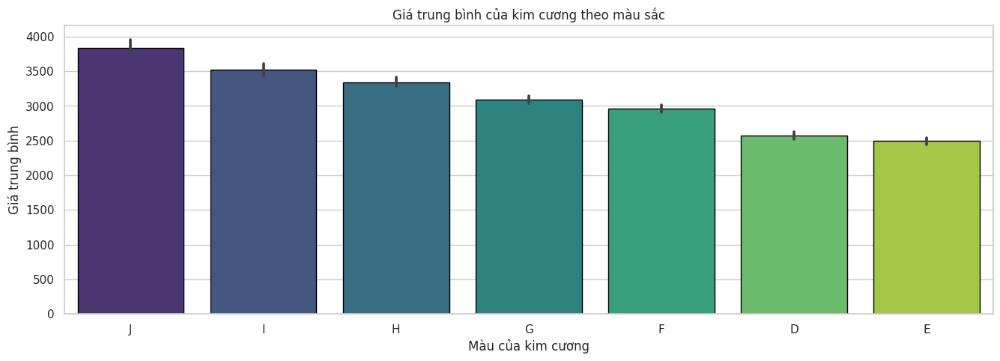

In [ ]:
plt.figure(figsize=(16, 5))
barplot = sns.barplot(x='color', y='price', data=processed_df, edgecolor='black', palette='viridis', order=processed_df.groupby('color')['price'].mean().sort_values(ascending=False).index)
barplot.set(title='Giá trung bình của kim cương theo màu sắc', xlabel='Màu của kim cương', ylabel='Giá trung bình')
plt.show()

**3. Biến Clarity**

In [ ]:
# Tạo bảng tổng hợp theo clarity
result = processed_df.groupby('clarity').agg(
    count=pd.NamedAgg(column='clarity', aggfunc='size'),
    Min_Price=pd.NamedAgg(column='price', aggfunc='min'),
    Average_Price=pd.NamedAgg(column='price', aggfunc='mean'),
    Max_Price=pd.NamedAgg(column='price', aggfunc='max')
).reset_index()

# Thêm cột percentage
result['percentage'] = 100 * round(result['count'] / result['count'].sum(), 3)

# Sắp xếp và chọn cột
result = result.sort_values(by='clarity').reset_index(drop=True)
result = result[['clarity', 'count', 'percentage', 'Min_Price', 'Average_Price', 'Max_Price']]

# Hiển thị bảng
table = tabulate(result, headers=["Index","Diamond Clarity", "Count", "Percentage", "Minimum Price", "Average Price", "Maximum Price"], tablefmt="pipe", colalign=('center', 'left', 'right', 'right', 'center', 'right', 'center'))
print(table)

|  Index  | Diamond Clarity   |   Count |   Percentage |  Minimum Price  |   Average Price |  Maximum Price  |
|:-------:|:------------------|--------:|-------------:|:---------------:|----------------:|:---------------:|
|    0    | I1                |     466 |            1 |       345       |         3291.41 |      10685      |
|    1    | IF                |    1616 |          3.5 |       369       |          1973.3 |      11025      |
|    2    | SI1               |   11248 |         24.2 |       326       |         3134.08 |      11040      |
|    3    | SI2               |    7217 |         15.5 |       326       |         3693.47 |      11037      |
|    4    | VS1               |    7242 |         15.6 |       338       |         3044.34 |      11019      |
|    5    | VS2               |   10699 |           23 |       334       |         2990.78 |      11039      |
|    6    | VVS1              |    3388 |          7.3 |       336       |         1978.83 |      11033      |
|

In [ ]:
clarity_order = processed_df.groupby('clarity')['price'].mean().sort_values(ascending=False).index

fig_box = px.box(processed_df, x='clarity', y='price', color='clarity', category_orders={'clarity': clarity_order}, points=False)
fig_box.update_traces(quartilemethod="exclusive")
fig_box.update_layout(title='Biểu đồ Boxplot giá kim cương theo độ trong suốt')
fig_box.show()

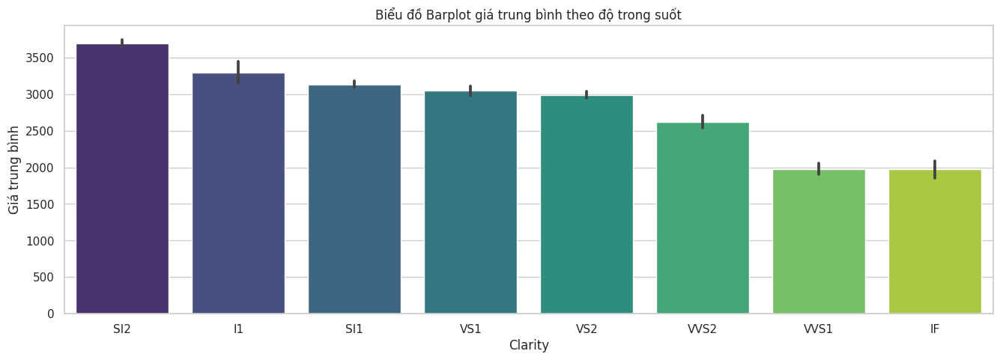

In [ ]:
fig, (ax1) = plt.subplots(1, figsize=(16, 5))
sns.barplot(x='clarity', y='price', data=processed_df, ax=ax1, order=processed_df.groupby('clarity')['price'].mean().sort_values(ascending=False).index, palette='viridis')
ax1.set(xlabel='Clarity', ylabel='Giá trung bình')
ax1.set_title('Biểu đồ Barplot giá trung bình theo độ trong suốt')
plt.show()

##*Các biến numeric ảnh hưởng đến giá kim cương như thế nào?*

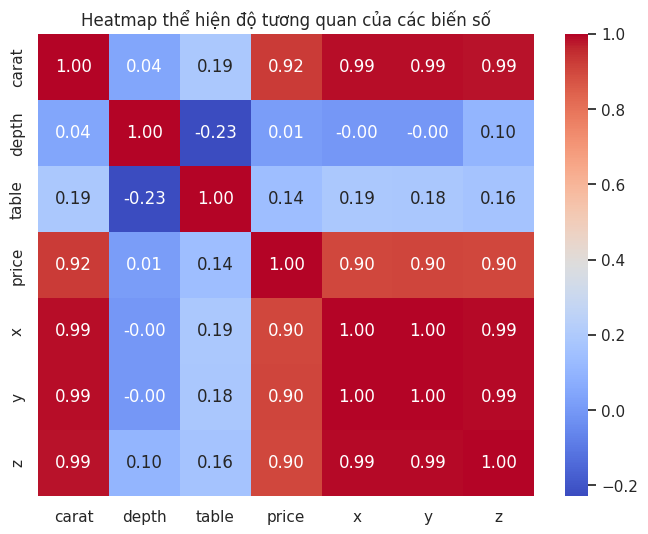

In [ ]:
#Bảng thể hiện mối tương quan giữa các biến số
matrix = processed_df.select_dtypes(exclude=['object'])
plt.figure(figsize=(8, 6))
sns.heatmap(matrix.corr(), annot=True, cmap='coolwarm', fmt='.2f')
plt.title('Heatmap thể hiện độ tương quan của các biến số')
plt.savefig('/content/gdrive/My Drive/dataviz_project/corr_heatmap.jpg')
plt.grid(False)
plt.show()

## Heatmap cho thấy sự tương quan mạnh giữa các biến 'price' và {'x','y','z','carat'}
## carat và {x,y,z} tương quan mạnh và {x,y,z} cũng tương quan mạnh với nhau
## Các nhóm biến {depth,x,y} không có tương quan tuyến tính
## Các nhóm biến {depth, price}, {depth, carat}, {table, carat,x,y,z,price} tương quan yếu
## Biến depth với table tương quan tuyến tính theo hướng nghịch đảo. Khi một biến tăng, biến còn lại giảm và ngược lại

###*Các biến tương quan mạnh với Price*

####*Price vs Carat*

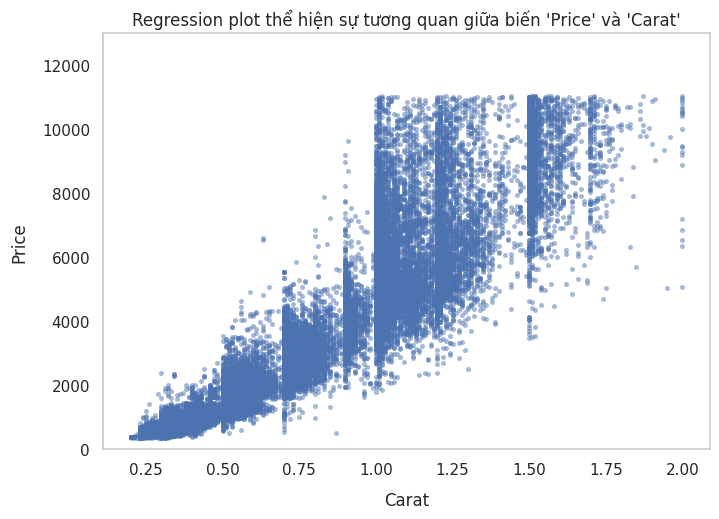

In [ ]:
plt.figure(figsize=(8, 6))
sns.regplot(x='carat', y='price', data=processed_df, scatter_kws={'s': 13, 'alpha': 0.5, 'edgecolors': 'w', 'linewidths': 0}, ci=None, line_kws={'color': 'red', 'lw': 2},fit_reg=False)
plt.ylim(0, 13000)
plt.title('Regression plot thể hiện sự tương quan giữa biến \'Price\' và \'Carat\'')
plt.xlabel('Carat', fontsize=12,labelpad=10)
plt.ylabel('Price', fontsize=12,labelpad=10)
plt.tight_layout(pad=3)
plt.savefig('/content/gdrive/My Drive/dataviz_project/price_carat.jpg')
plt.grid(False)
plt.show()

#####*Price vs {x,y,z, volumne (*xyz)}

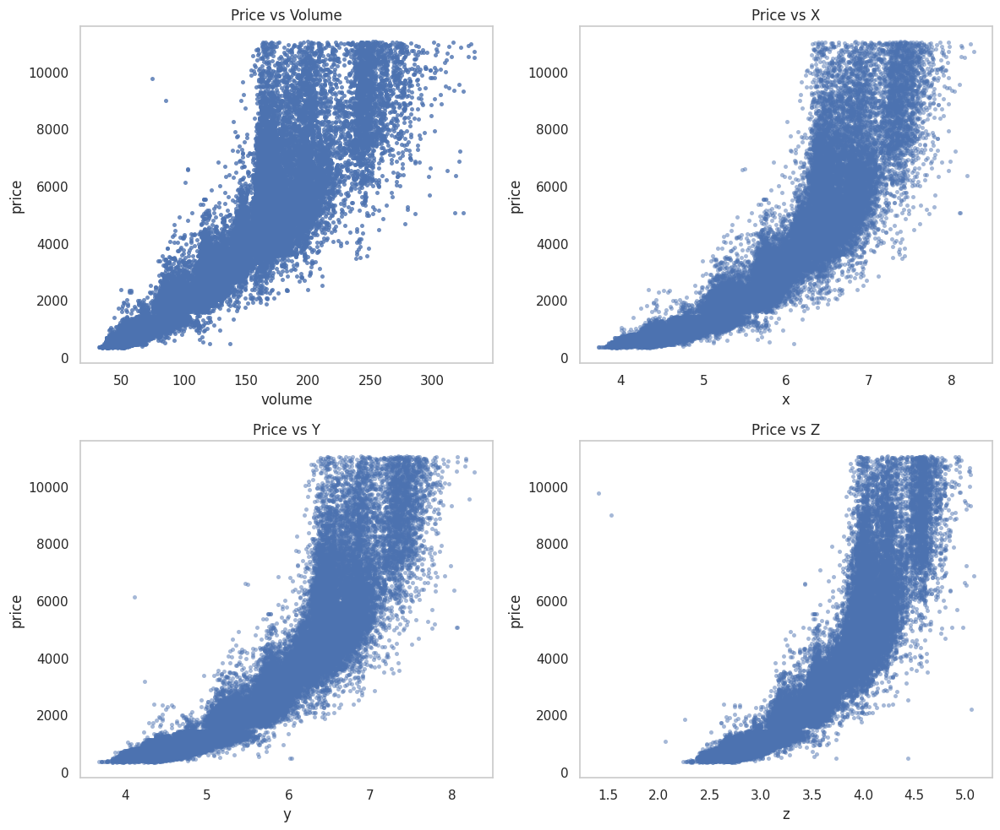

In [ ]:
viz['volume'] = viz['x'] * viz['y'] * viz['z']

fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(12, 10))

# Price vs Volume
sns.regplot(x='volume', y='price', data=viz, ax=axes[0, 0], scatter_kws={'s': 13, 'alpha': 0.8, 'edgecolors': 'w', 'linewidths': 0}, ci=None, fit_reg=False)
axes[0, 0].set_title('Price vs Volume')

# Price vs X
sns.regplot(x='x', y='price', data=viz, ax=axes[0, 1], scatter_kws={'s': 13, 'alpha': 0.5, 'edgecolors': 'w', 'linewidths': 0}, ci=None, fit_reg=False)
axes[0, 1].set_title('Price vs X')

# Price vs Y
sns.regplot(x='y', y='price', data=viz, ax=axes[1, 0], scatter_kws={'s': 13, 'alpha': 0.5, 'edgecolors': 'w', 'linewidths': 0}, ci=None, fit_reg=False)
axes[1, 0].set_title('Price vs Y')

# Price vs Z
sns.regplot(x='z', y='price', data=viz, ax=axes[1, 1], scatter_kws={'s': 13, 'alpha': 0.5, 'edgecolors': 'w', 'linewidths': 0}, ci=None, fit_reg=False)
axes[1, 1].set_title('Price vs Z')

plt.tight_layout()

# Tắt lưới
for ax in axes.flatten():
    ax.grid(False)
plt.savefig('/content/gdrive/My Drive/dataviz_project/price_highcorr.jpg')
plt.show()

###*Các biến tương quan yếu với Price*

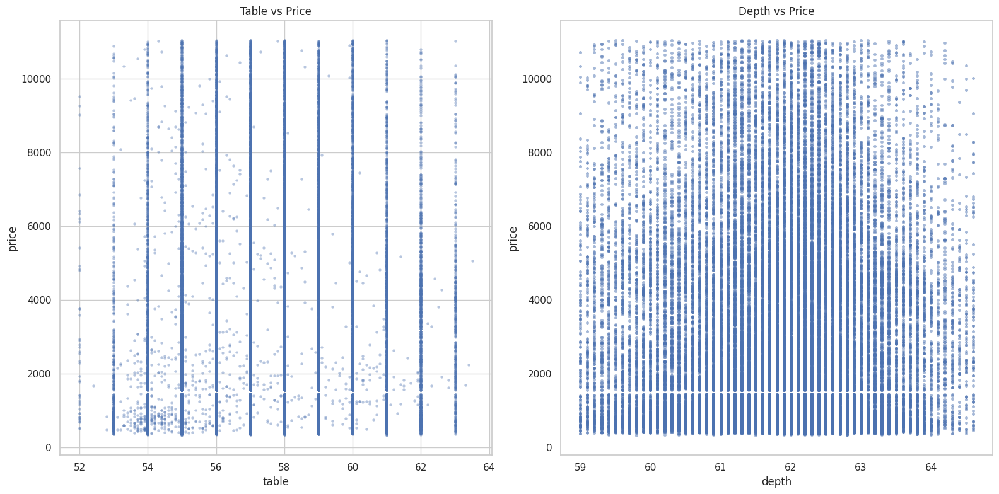

In [ ]:
fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(16, 8))

# Biểu đồ 1: Table vs Price
sns.regplot(x='table', y='price', data=viz, ax=ax[0],scatter_kws={'s': 10, 'alpha':0.4 ,'edgecolors': 'w', 'linewidths': 0}, ci=None, fit_reg= False)
ax[0].set_title('Table vs Price')

# Biểu đồ 2: Depth vs Price
sns.regplot(x='depth', y='price', data=viz, ax=ax[1],scatter_kws={'s': 13, 'alpha': 0.5, 'edgecolors': 'w', 'linewidths': 0}, ci=None, fit_reg=False)
ax[1].set_title('Depth vs Price')
for ax in axes.flatten():
    ax.grid(False)
plt.tight_layout()
plt.savefig('/content/gdrive/My Drive/dataviz_project/price_table_depth_uncorr.jpg')
plt.grid(False)
plt.show()

##*Bên cạnh sự tương quan với biến Price, các biến còn có sự tương quan nào khác với nhau không?*

###*Categorical vs Categorical*

####*Cut vs Color*

In [ ]:
# Chỉnh dạng dữ liệu từ crosstab thành longform table
df_ctclr = pd.melt(cut_color.reset_index(),id_vars = 'cut')
df_ctclr.columns = ['x','y','value']
df_ctclr

,x,y,value
0,Fair,D,44
1,Good,D,506
2,Ideal,D,2715
3,Premium,D,1429
4,Very Good,D,1361
5,Fair,E,33
6,Good,E,680
7,Ideal,E,3747
8,Premium,E,2081
9,Very Good,E,2187


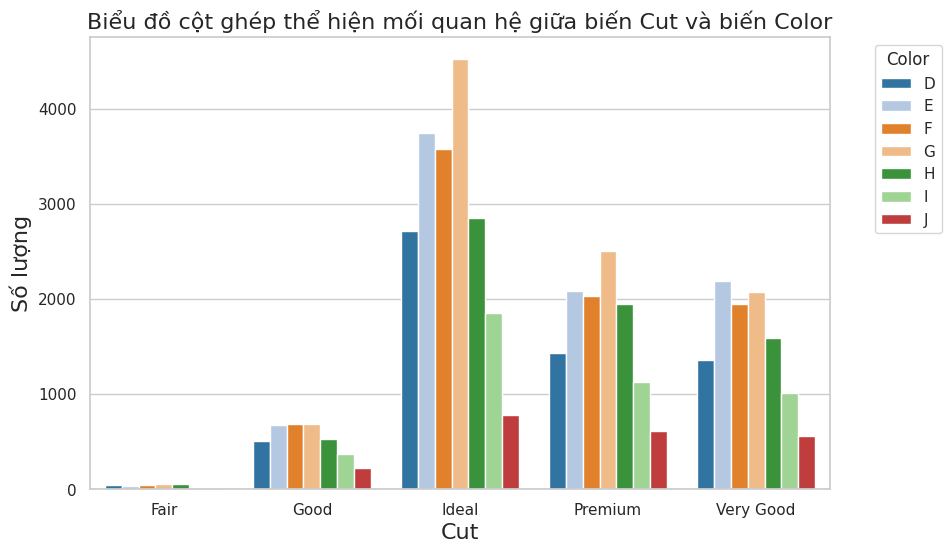

In [ ]:
plt.figure(figsize=(10,6))
sns.barplot(x='x',y='value',hue='y',data=df_ctclr,palette='tab20')
plt.title('Biểu đồ cột ghép thể hiện mối quan hệ giữa biến Cut và biến Color',fontsize=16)
plt.xlabel('Cut',fontsize=16)
plt.ylabel('Số lượng',fontsize=16)
plt.legend(title='Color', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout(pad=2.0)
plt.savefig("/content/gdrive/My Drive/dataviz_project/cut_color_bar.jpg")
plt.show()

####*Color vs Clarity*

In [ ]:
# Chỉnh dạng dữ liệu từ crosstab thành longform table
df_clr2 = pd.melt(color_clarity.reset_index(),id_vars = 'color')
df_clr2.columns = ['x','y','value']
df_clr2

,x,y,value
0,D,I1,34
1,E,I1,77
2,F,I1,100
3,G,I1,94
4,H,I1,91
5,I,I1,48
6,J,I1,22
7,D,IF,44
8,E,IF,126
9,F,IF,344


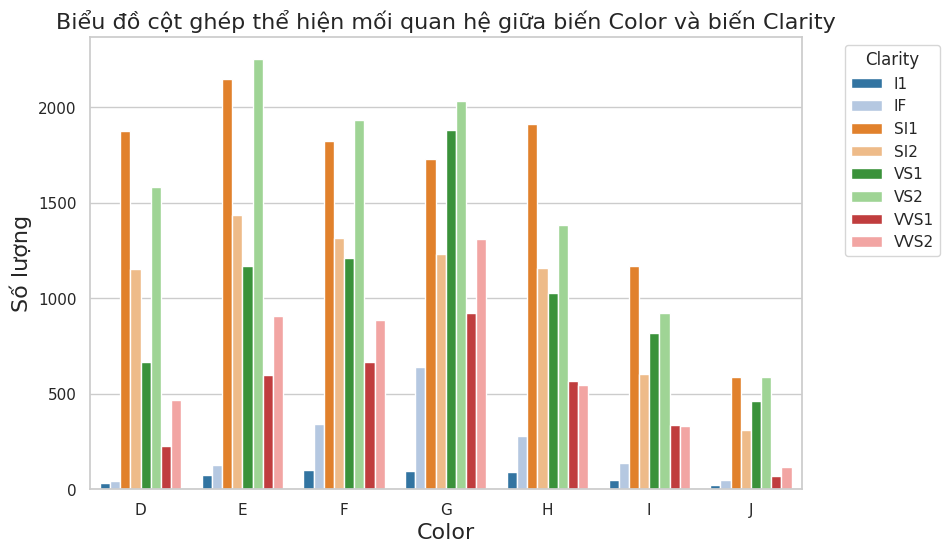

In [ ]:
plt.figure(figsize=(10,6))
sns.barplot(x='x',y='value',hue='y',data=df_clr2,palette='tab20')
plt.title('Biểu đồ cột ghép thể hiện mối quan hệ giữa biến Color và biến Clarity',fontsize=16)
plt.xlabel('Color',fontsize=16)
plt.ylabel('Số lượng',fontsize=16)
plt.legend(title='Clarity', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout(pad=2.0)
plt.savefig("/content/gdrive/My Drive/dataviz_project/color_clarity_bar.jpg")
plt.show()

####*Cut vs Clarity*

In [ ]:
# Chỉnh dạng dữ liệu từ crosstab thành longform table
df = pd.melt(cut_clarity.reset_index(),id_vars = 'cut')
df.columns = ['x','y','value']
df

,x,y,value
0,Fair,I1,33
1,Good,I1,64
2,Ideal,I1,136
3,Premium,I1,165
4,Very Good,I1,68
5,Fair,IF,5
6,Good,IF,41
7,Ideal,IF,1142
8,Premium,IF,201
9,Very Good,IF,227


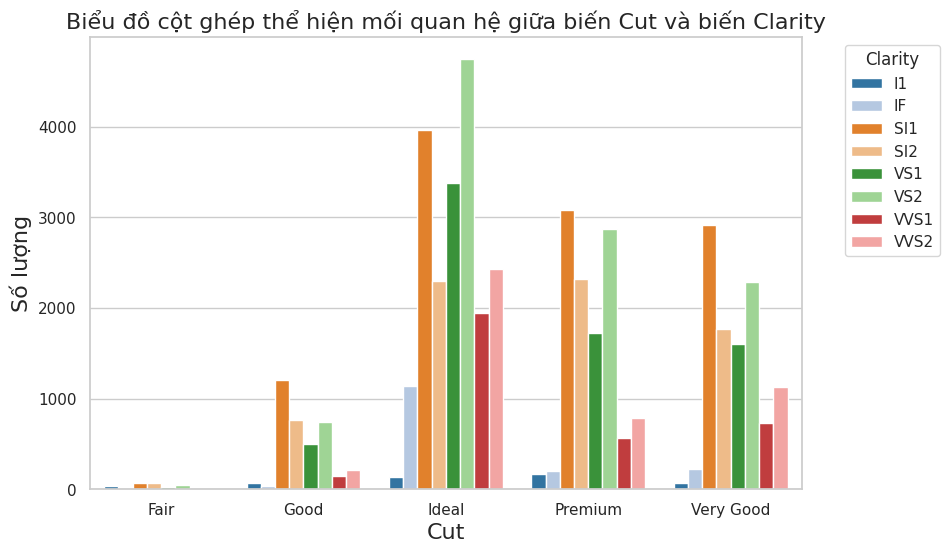

In [ ]:
plt.figure(figsize=(10,6))
sns.barplot(x='x',y='value',hue='y',data=df,palette='tab20')
plt.title('Biểu đồ cột ghép thể hiện mối quan hệ giữa biến Cut và biến Clarity',fontsize=16)
plt.xlabel('Cut',fontsize=16)
plt.ylabel('Số lượng',fontsize=16)
plt.legend(title='Clarity', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout(pad=2.0)
plt.savefig("/content/gdrive/My Drive/dataviz_project/cut_clarity_bar.jpg")
plt.show()

###*Numeric vs Numeric*

####*Tương quan*

#####*Carat vs {x,yz}*

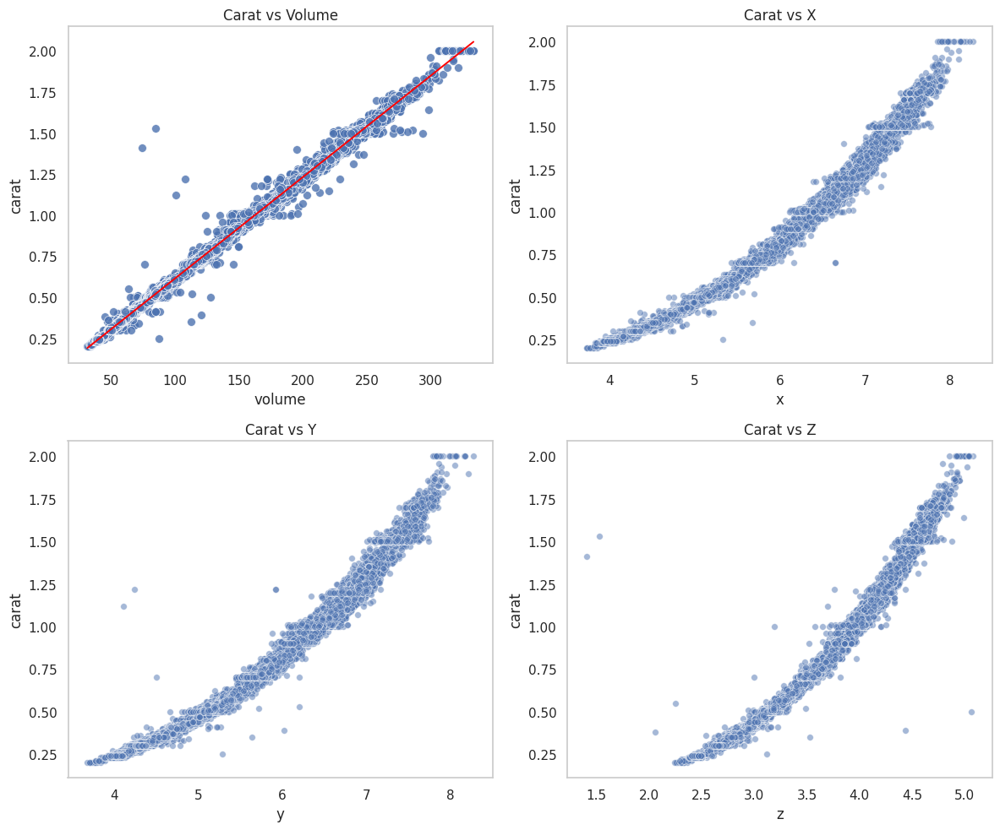

In [ ]:
fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(12, 10))
# Carat vs Volumne
sns.regplot(x='volume', y='carat', data=viz, ax=axes[0,0],scatter_kws={'s': 50, 'alpha':0.8 ,'edgecolors': 'w', 'linewidths': 0.5}, ci=None, line_kws={'color': 'red', 'lw': 1.4})
axes[0, 0].set_title('Carat vs Volume')

# Carat vs X
sns.regplot(x='x', y='carat', data=viz, ax=axes[0,1], scatter_kws={'s': 30, 'alpha': 0.5, 'edgecolors': 'w', 'linewidths': 0.5}, ci=None, line_kws={'color': 'red', 'lw': 2},fit_reg=False)
axes[0, 1].set_title('Carat vs X')

# Carat vs Y
sns.regplot(x='y', y='carat', data=viz, ax=axes[1,0],scatter_kws={'s': 30, 'alpha': 0.5, 'edgecolors': 'w', 'linewidths': 0.5}, ci=None, fit_reg=False)
axes[1, 0].set_title('Carat vs Y')

# Carat vs Z
sns.regplot(x='z', y='carat', data=viz, ax=axes[1,1], scatter_kws={'s': 30, 'alpha': 0.5, 'edgecolors': 'w', 'linewidths': 0.5}, ci=None, fit_reg=False)
axes[1, 1].set_title('Carat vs Z')
for ax in axes.flatten():
    ax.grid(False)
plt.tight_layout()
plt.savefig("/content/gdrive/My Drive/dataviz_project/carat_xyz.jpg")
plt.show()

#####*x vs {y,z}*

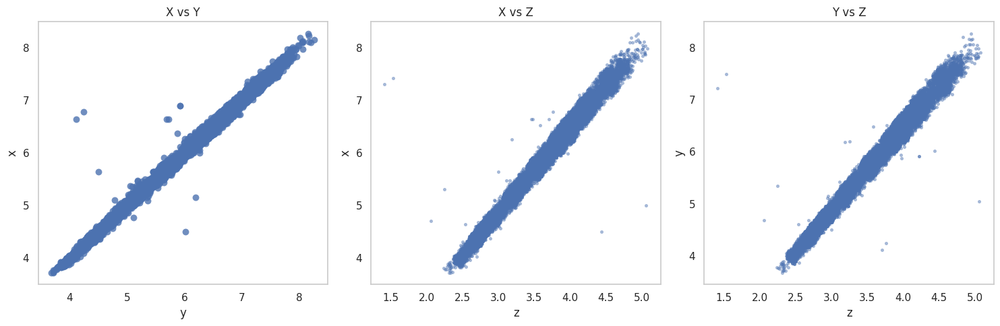

In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(15, 5))
# X vs Y
sns.regplot(x='y', y='x', data=viz, ax=axes[0],scatter_kws={'s': 50, 'alpha':0.8 ,'edgecolors': 'w', 'linewidths': 0}, ci=None, fit_reg= False)
axes[0].set_title('X vs Y')

# X vs Z
sns.regplot(x='z', y='x', data=viz, ax=axes[1] ,scatter_kws={'s': 13, 'alpha': 0.5, 'edgecolors': 'w', 'linewidths': 0}, ci=None, fit_reg=False)
axes[1].set_title('X vs Z')

# Y vs Z
sns.regplot(x='z', y='y', data=viz, ax=axes[2],scatter_kws={'s': 13, 'alpha': 0.5, 'edgecolors': 'w', 'linewidths': 0}, ci=None, fit_reg=False)
axes[2].set_title('Y vs Z')

plt.subplots_adjust(wspace=0.4)
plt.tight_layout()
for ax in axes.flatten():
    ax.grid(False)
plt.savefig("/content/gdrive/My Drive/dataviz_project/x_yz.jpg")
plt.show()

#####*Không tương quan và tương quan nghịch*

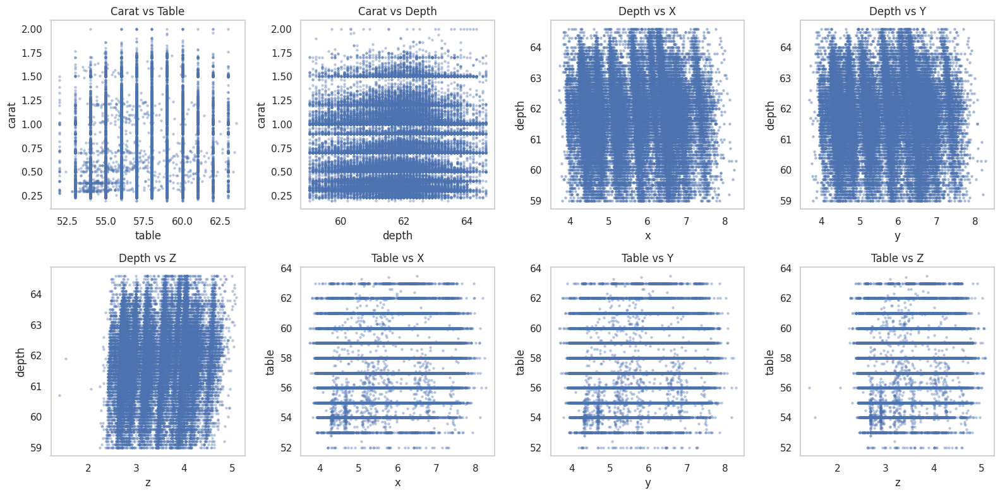

In [ ]:
## carat vs {table,depth}; depth vs z; table vs {x,y,z}

fig, axes = plt.subplots(nrows=2, ncols=4, figsize=(16, 8))

# Biểu đồ 1: Carat vs Table
sns.regplot(x='table', y='carat',data=viz, ax=axes[0,0],scatter_kws={'s': 10, 'alpha':0.4 ,'edgecolors': 'w', 'linewidths': 0}, ci=None, fit_reg= False)
axes[0, 0].set_title('Carat vs Table')

# Biểu đồ 2: Carat vs Depth
sns.regplot(x='depth', y='carat', data=viz, ax=axes[0, 1],scatter_kws={'s': 10, 'alpha':0.4 ,'edgecolors': 'w', 'linewidths': 0}, ci=None, fit_reg= False)
axes[0, 1].set_title('Carat vs Depth')

# Biểu đồ 3: Depth vs X
sns.regplot(x='x', y='depth', data=viz, ax=axes[0,2] ,scatter_kws={'s': 10, 'alpha': 0.5, 'edgecolors': 'w', 'linewidths': 0}, ci=None, fit_reg=False)
axes[0,2].set_title('Depth vs X')

# Biểu đồ 4: Depth vs Y
sns.regplot(x='y', y='depth', data=viz, ax=axes[0,3] ,scatter_kws={'s': 10, 'alpha': 0.5, 'edgecolors': 'w', 'linewidths': 0}, ci=None, fit_reg=False)
axes[0,3].set_title('Depth vs Y')

# Biểu đồ 5: Depth vs Z
sns.regplot(x='z', y='depth', data=viz, ax=axes[1, 0],scatter_kws={'s': 10, 'alpha':0.4 ,'edgecolors': 'w', 'linewidths': 0}, ci=None, fit_reg= False)
axes[1,0 ].set_title('Depth vs Z')

# Biểu đồ 6: Table vs X
sns.regplot(x='x', y='table', data=viz, ax=axes[1, 1],scatter_kws={'s': 10, 'alpha':0.4 ,'edgecolors': 'w', 'linewidths': 0}, ci=None, fit_reg= False)
axes[1, 1].set_title('Table vs X')

# Biểu đồ 7: Table vs Y
sns.regplot(x='y', y='table', data=viz, ax=axes[1, 2],scatter_kws={'s': 10, 'alpha':0.4 ,'edgecolors': 'w', 'linewidths': 0}, ci=None, fit_reg= False)
axes[1, 2].set_title('Table vs Y')

# Biểu đồ 8: Table vs Z
sns.regplot(x='z', y='table', data=viz, ax=axes[1, 3],scatter_kws={'s': 10, 'alpha':0.4 ,'edgecolors': 'w', 'linewidths': 0}, ci=None, fit_reg= False)
axes[1, 3].set_title('Table vs Z')


plt.tight_layout()
for ax in axes.flatten():
    ax.grid(False)
plt.savefig("/content/gdrive/My Drive/dataviz_project/no_corr.jpg")
plt.show()

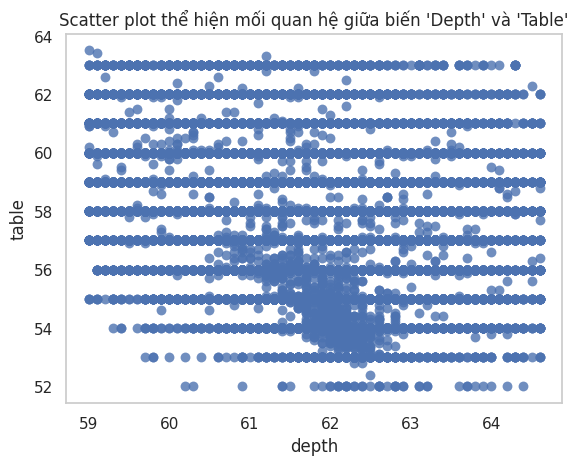

In [ ]:
plt.title('Scatter plot thể hiện mối quan hệ giữa biến \'Depth\' và \'Table\'')
sns.regplot(x='depth', y='table', data=viz, scatter_kws={'s': 50, 'alpha':0.8 ,'edgecolors': 'w', 'linewidths': 0}, ci=None, fit_reg= False)
plt.grid(False)
plt.savefig("/content/gdrive/My Drive/dataviz_project/depth_table.jpg")
plt.show()

###*Numeric vs Categorical*

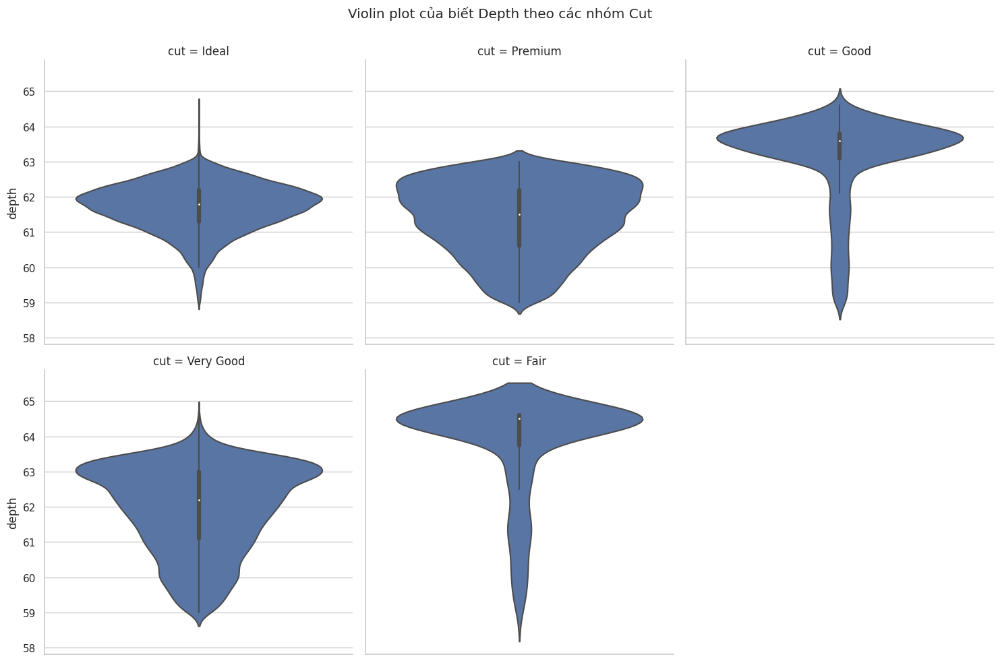

In [ ]:
#Depth Vs Cut
depth_cut = sns.catplot(y='depth', kind='violin', hue='cut', data=viz,
                col='cut', col_wrap=3)
depth_cut.fig.subplots_adjust(top=0.9)
depth_cut.fig.suptitle('Violin plot của biết Depth theo các nhóm Cut')
plt.savefig("/content/gdrive/My Drive/dataviz_project/depth_cut.jpg")
plt.grid(False)
plt.show()

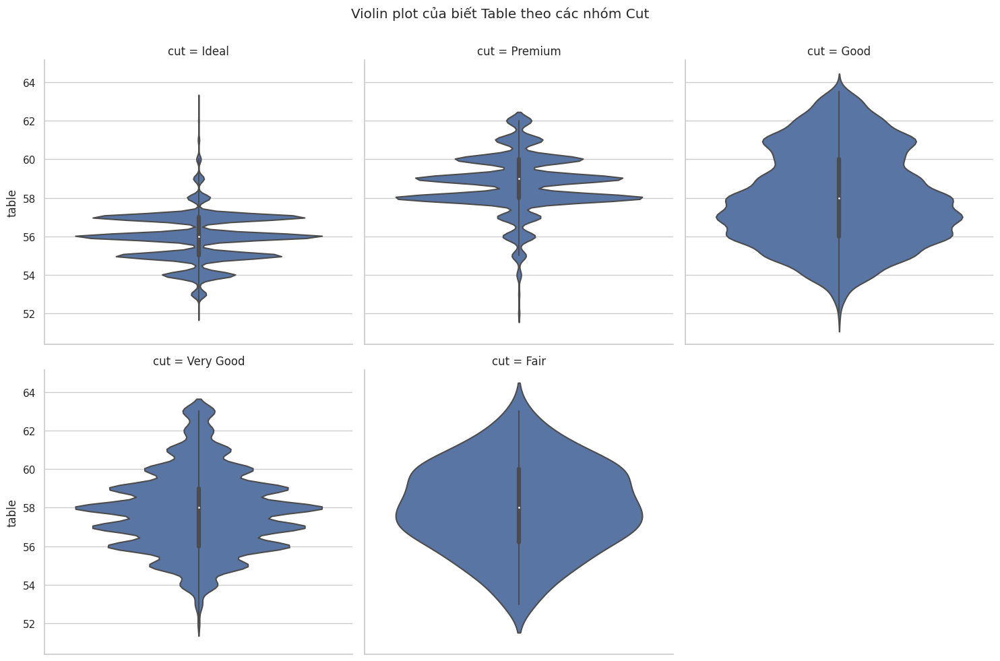

In [ ]:
#Table Vs Cut
table_cut = sns.catplot(y='table', kind='violin', hue='cut', data=viz,
                col='cut', col_wrap=3)
table_cut.fig.subplots_adjust(top=0.9)
table_cut.fig.suptitle('Violin plot của biết Table theo các nhóm Cut')
plt.savefig("/content/gdrive/My Drive/dataviz_project/table_cut.jpg")
plt.grid(False)
plt.show()

#**Phân tích 3 biến**

In [ ]:
processed_df['new_clarity'] = processed_df.clarity.replace({
    'SI1': 'SI',
    'SI2': 'SI',
    'VS1':'VS',
    'VS2':'VS',
    'VVS1':'VVS',
    'VVS2':'VVS'})

In [ ]:
processed_df['type_color'] = processed_df.color.replace({
    'D': 'Colorless',
    'E': 'Colorless',
    'F':'Colorless',
    'G':'Near-colorless',
    'H':'Near-colorless',
    'I':'Near-colorless',
    'J':'Near-colorless'
    })

##*Clarity vs Cut vs Color*

In [ ]:
processed_df_copy = processed_df.copy()
color_map = {
    'Fair': 'red',
    'Good': 'blue',
    'Very Good': 'purple',
    'Premium': 'orange',
    'Ideal': 'green'
}

processed_df_copy['cut_color'] = processed_df_copy['cut'].map(color_map)

fig = px.parallel_categories(processed_df_copy, dimensions=['clarity', 'cut', 'color'], color='cut_color')
fig.show()

In [ ]:
color_map = {
    'I1': 'red',
    'SI2': 'green',
    'SI1': 'blue',
    'VS2': 'orange',
    'VS1': 'purple',
    'VVS2': 'yellow',
    'VVS1': 'cyan',
    'IF': 'magenta'
}

processed_df_copy['clarity_color'] = processed_df_copy['clarity'].map(color_map)

fig = px.parallel_categories(processed_df_copy, dimensions=['clarity', 'cut', 'color'], color='clarity_color')
fig.show()

##*Price and Carat by Cut*

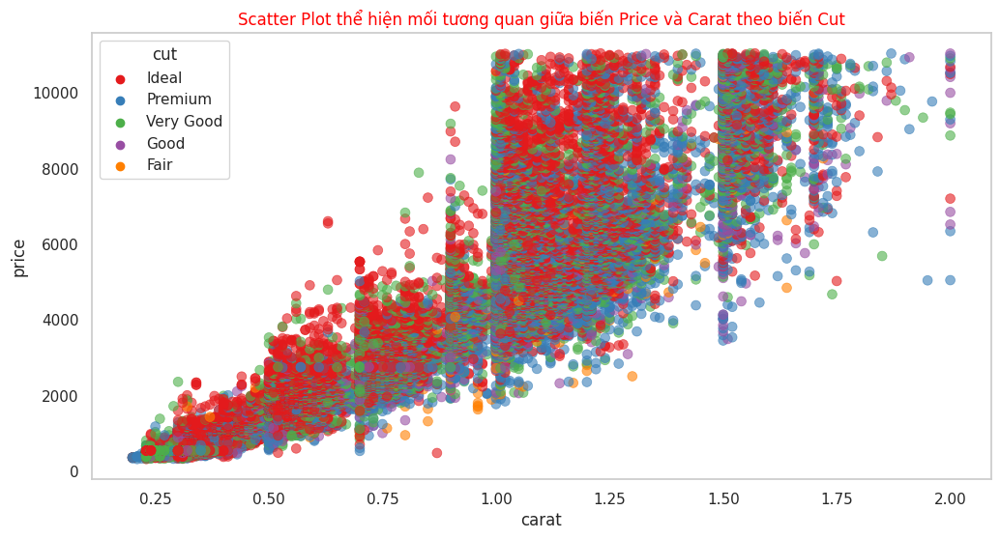

In [ ]:
# Biểu đồ Scatter giữa 'price' và 'carat' với màu sắc biểu thị 'cut'
plt.figure(figsize=(12, 6))
cut_order = ['Ideal', 'Premium', 'Very Good', 'Good', 'Fair']

sns.scatterplot(x='carat', y='price', hue='cut', hue_order=cut_order, data=processed_df, palette='Set1', s=50, edgecolor = None, alpha = 0.6)
plt.title('Scatter Plot thể hiện mối tương quan giữa biến Price và Carat theo biến Cut',  color = 'red')
plt.grid(False)
plt.show()

##*Price and Carat by Clarity*

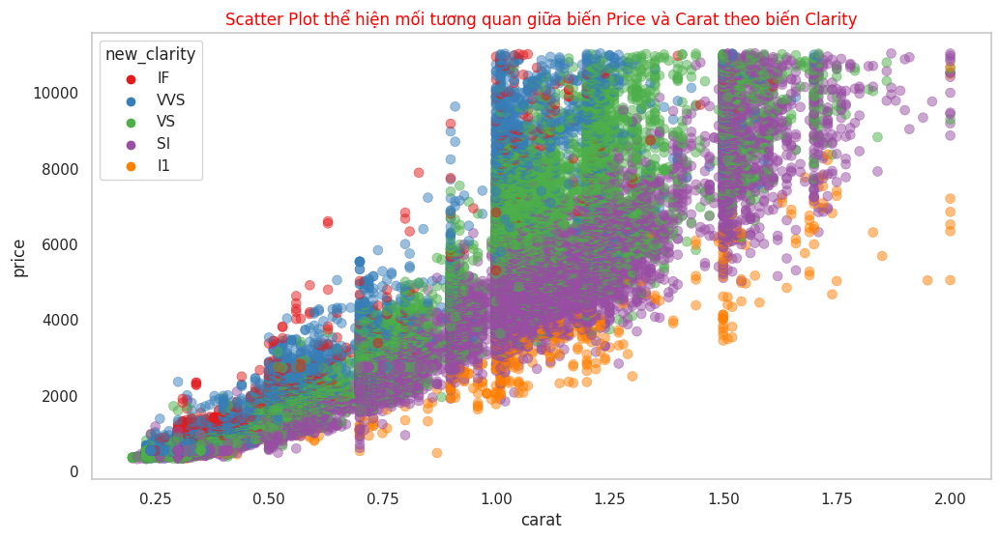

In [ ]:
# Biểu đồ Scatter giữa 'price' và 'carat' với màu sắc biểu thị 'clarity'
plt.figure(figsize=(12, 6))

clarity_order = ['IF', 'VVS', 'VS', 'SI', 'I1']

sns.scatterplot(x='carat', y='price', hue='new_clarity', hue_order=clarity_order, data=processed_df, palette='Set1', s=50,alpha = 0.5, edgecolor = None)
plt.title('Scatter Plot thể hiện mối tương quan giữa biến Price và Carat theo biến Clarity', color = 'red')
plt.grid(False)
plt.show()


##*Price and Carat by Color*

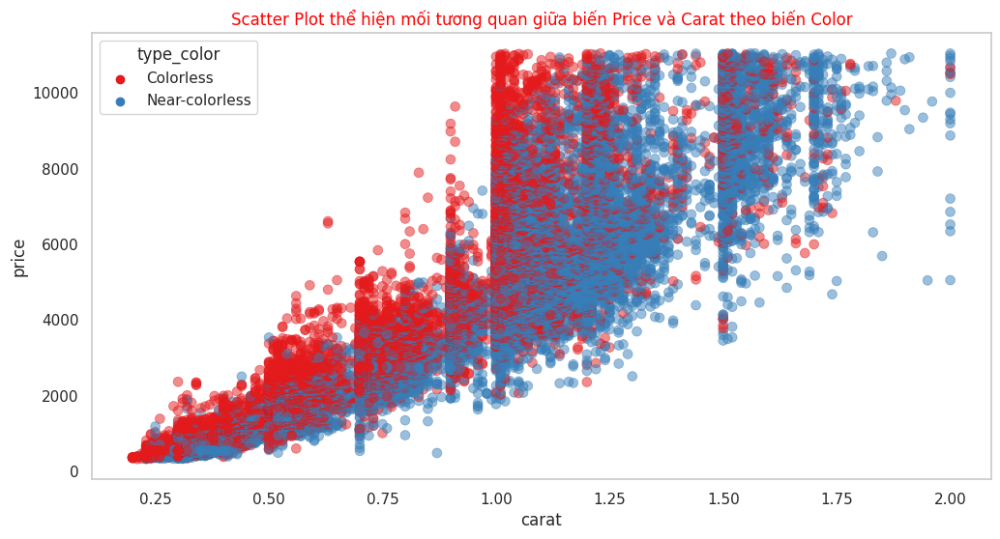

In [ ]:
# Biểu đồ Scatter giữa 'price' và 'carat' với màu sắc biểu thị 'color'
plt.figure(figsize=(12, 6))
sns.scatterplot(x='carat', y='price', hue='type_color', data=processed_df, palette='Set1', s=50, edgecolor = None, alpha=0.5)
plt.title('Scatter Plot thể hiện mối tương quan giữa biến Price và Carat theo biến Color', color = 'red')
plt.grid(False)
plt.show()

##*Price by Cut and Color*

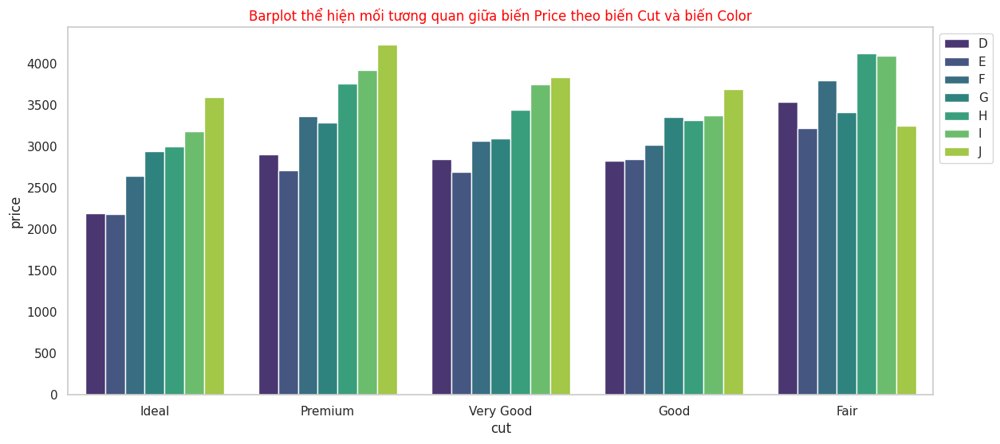

In [ ]:
# Biểu đồ barplot giữa 'cut' và 'color' với 'price'
plt.figure(figsize=(14, 6))

color_order = processed_df.color.unique()
color_order.sort()

sns.barplot(x='cut', y='price', hue='color',order=cut_order,hue_order=color_order, ci=None, data=processed_df, palette='viridis')
plt.title('Barplot thể hiện mối tương quan giữa biến Price theo biến Cut và biến Color',color ='red')
plt.legend(loc='upper left', bbox_to_anchor=(1, 1))
plt.grid(False)
plt.show()

##*Price by Cut and Clarity*

#**Máy học**

# *Import thư viện*

In [ ]:
from sklearn.preprocessing      import OneHotEncoder, LabelEncoder
from sklearn.model_selection    import train_test_split, cross_val_score
from sklearn.neighbors          import KNeighborsRegressor
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import PolynomialFeatures
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.svm import SVR
from sklearn                    import metrics
from sklearn.metrics            import r2_score
from sklearn.metrics            import accuracy_score, mean_squared_error, mean_absolute_error
from sklearn                    import preprocessing
from math                       import sqrt
from plotly.offline               import plot
from IPython.display            import HTML
import plotly.graph_objs        as go
import plotly.io                as pio
import os
import warnings
warnings.filterwarnings('ignore')

##*Tiền xử lý trước khi xây dựng mô hình*

In [ ]:
processed_df['volume'] = processed_df['x']*processed_df['y']*processed_df['z']

In [ ]:
categorical_col =list()
for col in processed_df.dtypes.index:
    if processed_df.dtypes[col] == 'object':
        categorical_col.append(col)

In [ ]:
processed_df

,carat,depth,table,price,x,y,z,color,clarity,cut,new_clarity,type_color,volume
0,0.23,61.5,55.0,326.0,3.95,3.98,2.43,E,SI2,Ideal,SI,Colorless,38.202030
1,0.21,59.8,61.0,326.0,3.89,3.84,2.31,E,SI1,Premium,SI,Colorless,34.505856
3,0.29,62.4,58.0,334.0,4.20,4.23,2.63,I,VS2,Premium,VS,Near-colorless,46.724580
4,0.31,63.3,58.0,335.0,4.34,4.35,2.75,J,SI2,Good,SI,Near-colorless,51.917250
5,0.24,62.8,57.0,336.0,3.94,3.96,2.48,J,VVS2,Very Good,VVS,Near-colorless,38.693952
...,...,...,...,...,...,...,...,...,...,...,...,...,...
53789,0.72,60.8,57.0,2757.0,5.75,5.76,3.50,D,SI1,Ideal,SI,Colorless,115.920000
53790,0.72,63.1,55.0,2757.0,5.69,5.75,3.61,D,SI1,Good,SI,Colorless,118.110175
53791,0.70,62.8,60.0,2757.0,5.66,5.68,3.56,D,SI1,Very Good,SI,Colorless,114.449728
53792,0.86,61.0,58.0,2757.0,6.15,6.12,3.74,H,SI2,Premium,SI,Near-colorless,140.766120


In [ ]:
ml = processed_df[['price','carat','color','clarity','cut','volume']]
categorical_col =list()
for col in ml.dtypes.index:
    if ml.dtypes[col] == 'object':
        categorical_col.append(col)

label_encoder = LabelEncoder()
for col in categorical_col:
    ml[col] = label_encoder.fit_transform(ml[col])
    print(f"Giá trị ban đầu của cột {col}:")
    for idx, label in enumerate(label_encoder.classes_):
      print(f" Giá trị đã encoded {idx} tương đương với giá trị gốc ban đầu là '{label}'")
    print("\n")

Giá trị ban đầu của cột color:
 Giá trị đã encoded 0 tương đương với giá trị gốc ban đầu là 'D'
 Giá trị đã encoded 1 tương đương với giá trị gốc ban đầu là 'E'
 Giá trị đã encoded 2 tương đương với giá trị gốc ban đầu là 'F'
 Giá trị đã encoded 3 tương đương với giá trị gốc ban đầu là 'G'
 Giá trị đã encoded 4 tương đương với giá trị gốc ban đầu là 'H'
 Giá trị đã encoded 5 tương đương với giá trị gốc ban đầu là 'I'
 Giá trị đã encoded 6 tương đương với giá trị gốc ban đầu là 'J'


Giá trị ban đầu của cột clarity:
 Giá trị đã encoded 0 tương đương với giá trị gốc ban đầu là 'I1'
 Giá trị đã encoded 1 tương đương với giá trị gốc ban đầu là 'IF'
 Giá trị đã encoded 2 tương đương với giá trị gốc ban đầu là 'SI1'
 Giá trị đã encoded 3 tương đương với giá trị gốc ban đầu là 'SI2'
 Giá trị đã encoded 4 tương đương với giá trị gốc ban đầu là 'VS1'
 Giá trị đã encoded 5 tương đương với giá trị gốc ban đầu là 'VS2'
 Giá trị đã encoded 6 tương đương với giá trị gốc ban đầu là 'VVS1'
 Giá trị đã

In [ ]:
x, y = ml.drop(["price"], axis=1), ml.price
xtrain , xtest , ytrain , ytest = train_test_split(x , y , test_size =0.3 , random_state = 42)

##*Xây dựng mô hình*

In [ ]:

pipeline_lr=Pipeline([("scalar1",StandardScaler()),
                     ("lr_classifier",LinearRegression())])

pipeline_dt=Pipeline([("scalar2",StandardScaler()),
                     ("dt_classifier",DecisionTreeRegressor())])

pipeline_rf=Pipeline([("scalar3",StandardScaler())),
                     ("rf_classifier",RandomForestRegressor())])


pipeline_svm=Pipeline([("scalar4",StandardScaler()),
                     ("svm_classifier",SVR())])

pipeline_knn = Pipeline([("scalar5", StandardScaler()),("knn_regressor", KNeighborsRegressor())])

# List of all the pipelines
pipelines = [pipeline_lr, pipeline_dt, pipeline_rf, pipeline_svm, pipeline_knn]

# Dictionary of pipelines and model types for ease of reference
pipe_dict = {0: "LinearRegression", 1: "DecisionTree", 2: "RandomForest",3: "SVM",4:"KNeighborsRegressor"}

# Fit the pipelines
for pipe in pipelines:
    pipe.fit(xtrain, ytrain)

##*Đánh giá mô hình*

In [ ]:
cv_results_rms = []
for i, model in enumerate(pipelines):
    cv_score = cross_val_score(model, xtrain, ytrain,scoring="neg_root_mean_squared_error", cv=10)
    cv_results_rms.append(cv_score)
    print("%s: %f " % (pipe_dict[i], cv_score.mean()))

LinearRegression: -881.082791 
DecisionTree: -491.673347 
RandomForest: -386.407096 
SVM: -1537.402252 
KNeighborsRegressor: -413.455557 


In [ ]:
myPipes = [pipeline_lr,pipeline_dt,pipeline_rf,pipeline_svm]
ypreds = []
for pipe in myPipes:
    start_time = np.datetime64('now')
    pipe.fit(xtrain,ytrain)
    ypreds.append(pipe.predict(xtest))
    period = pd.Timedelta(np.datetime64('now')-start_time).total_seconds()
    modelname = str(pipe[-1]).split('(')[0]
    print(f'fitting model {modelname} took {period} seconds', '\n', '-'*50)

fitting model LinearRegression took 0.0 seconds 
 --------------------------------------------------
fitting model DecisionTreeRegressor took 0.0 seconds 
 --------------------------------------------------
fitting model RandomForestRegressor took 9.0 seconds 
 --------------------------------------------------
fitting model SVR took 97.0 seconds 
 --------------------------------------------------



 ============================== by using metric of mean_absolute_error ============================== 

    LinearRegression 	 : 608.112753679573
DecisionTreeRegressor 	 : 271.46541783296254
RandomForestRegressor 	 : 217.63895586474501
                 SVR 	 : 804.4537643049615


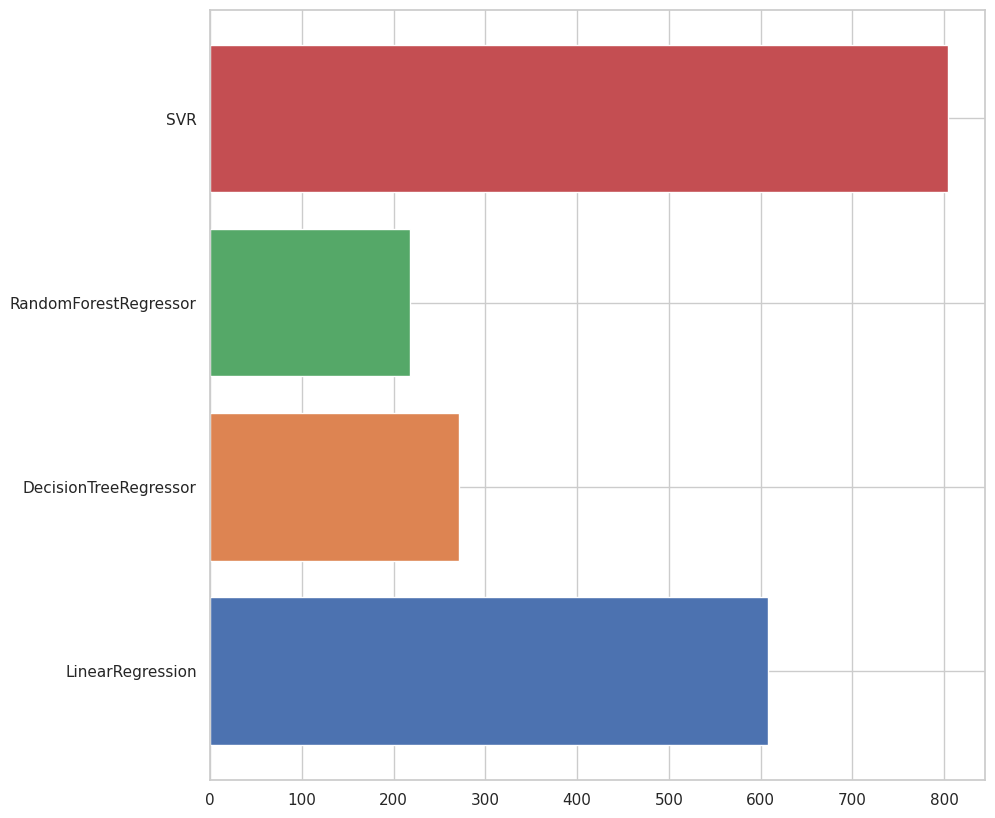


 ============================== by using metric of mean_squared_error =============================== 

    LinearRegression 	 : 759856.4284620702
DecisionTreeRegressor 	 : 229845.81851240463
RandomForestRegressor 	 : 140697.39024086652
                 SVR 	 : 2199773.960049781


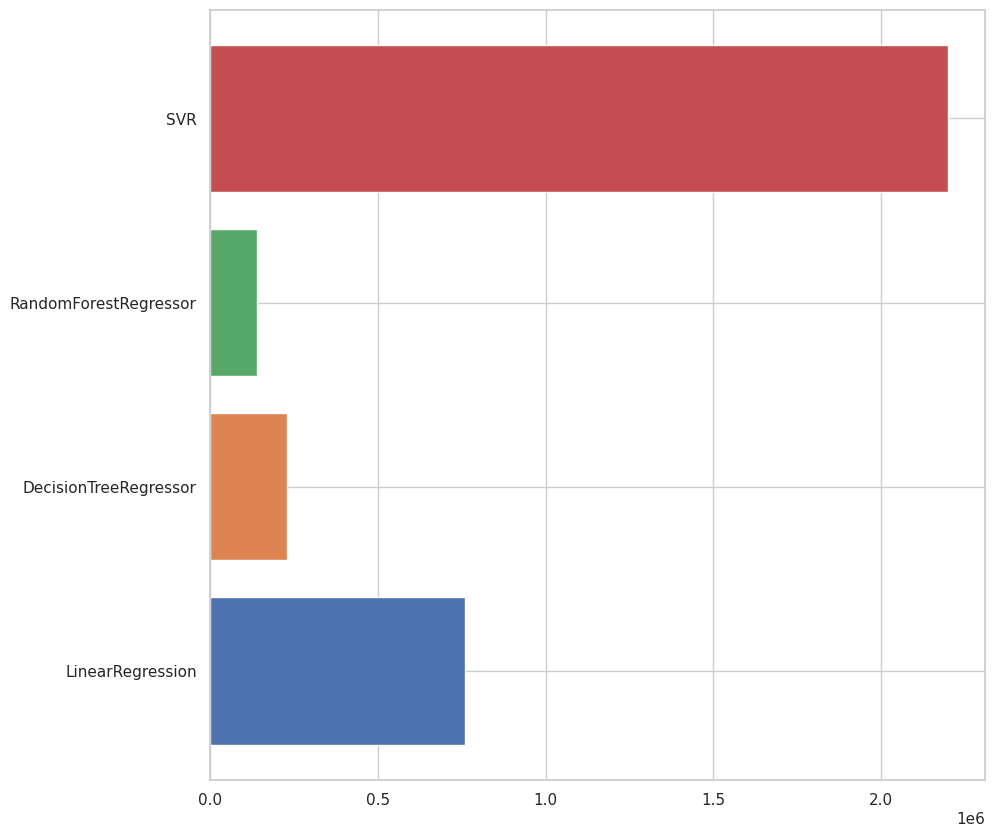


 =================================== by using metric of r2_score ==================================== 

    LinearRegression 	 : 0.8721879088537899
DecisionTreeRegressor 	 : 0.9655094886291254
RandomForestRegressor 	 : 0.9786248379285306
                 SVR 	 : 0.06004917820028355


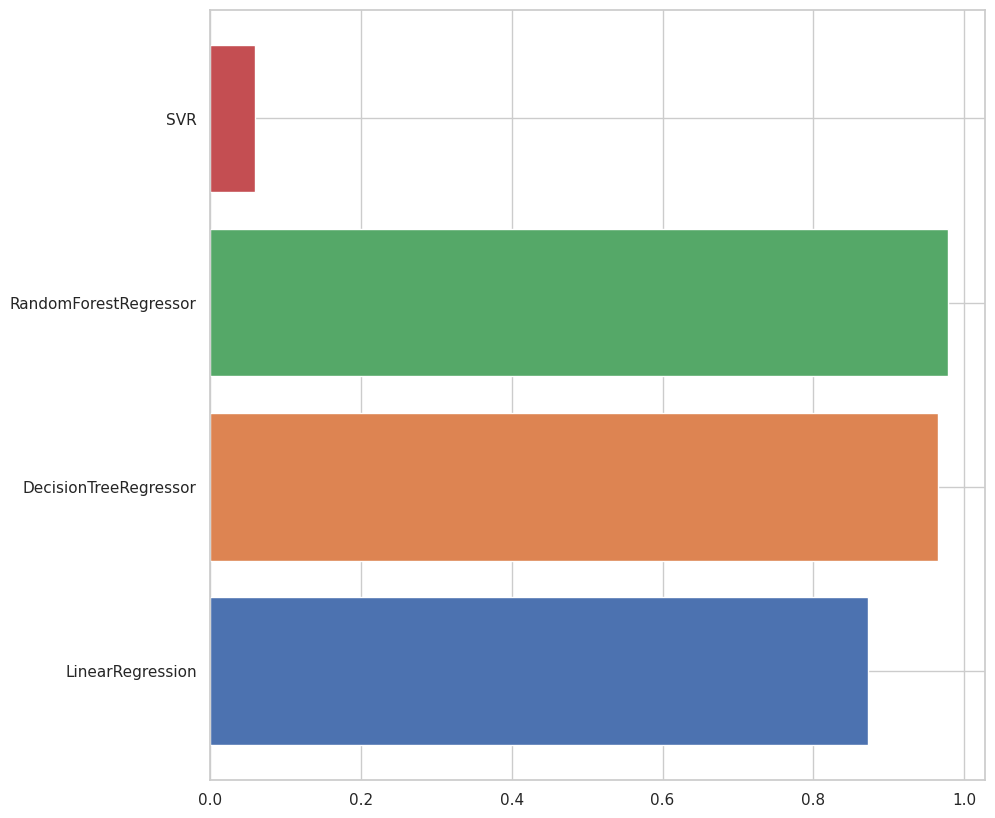

In [ ]:
results = dict
for i in [mean_absolute_error, mean_squared_error, r2_score]:
    plt.subplots(figsize=(10,10))
    metric_name = str(i).split()[1]
    print('\n',f' by using metric of {metric_name} '.center(100,'='),'\n')
    for j in range(len(myPipes)):
        score=i(ypreds[j],ytest)
        modelname = str(myPipes[j][-1]).split('(')[0]
        print(modelname.rjust(20),'\t :', score)
        plt.barh(modelname,score)
    plt.show()

In [ ]:
def predict_diamond_price():

  carat=input('Nhập vào kích cỡ carat: ')
  cut = int(input('Nhập vào giá trị của cut: '))
  clarity = int(input('Nhập vào giá trị của clarity: '))
  color = int(input('Nhập vào giá trị của color: '))
  volume = int(input('Nhập vào giá trị của volume: '))
  price = pipeline_rf.predict([[carat, cut, clarity, color, volume]])
  print('Giá trị dự đoán của kim cương là:',price)

pred_1 = predict_diamond_price()

Nhập vào kích cỡ carat: 4
Nhập vào giá trị của cut: 5
Nhập vào giá trị của clarity: 2
Nhập vào giá trị của color: 3
Nhập vào giá trị của volume: 120
Giá trị dự đoán của kim cương là: [10366.28]
